Mostrando imagen aleatoria con ID: 7f1638ea57dd009b6a86d47f7a369fa2 y Study ID: 7bdfdd72d14a004a88918758eec0ebf8
ROI #2046: ['Mass'], BIRADS: BI-RADS 4


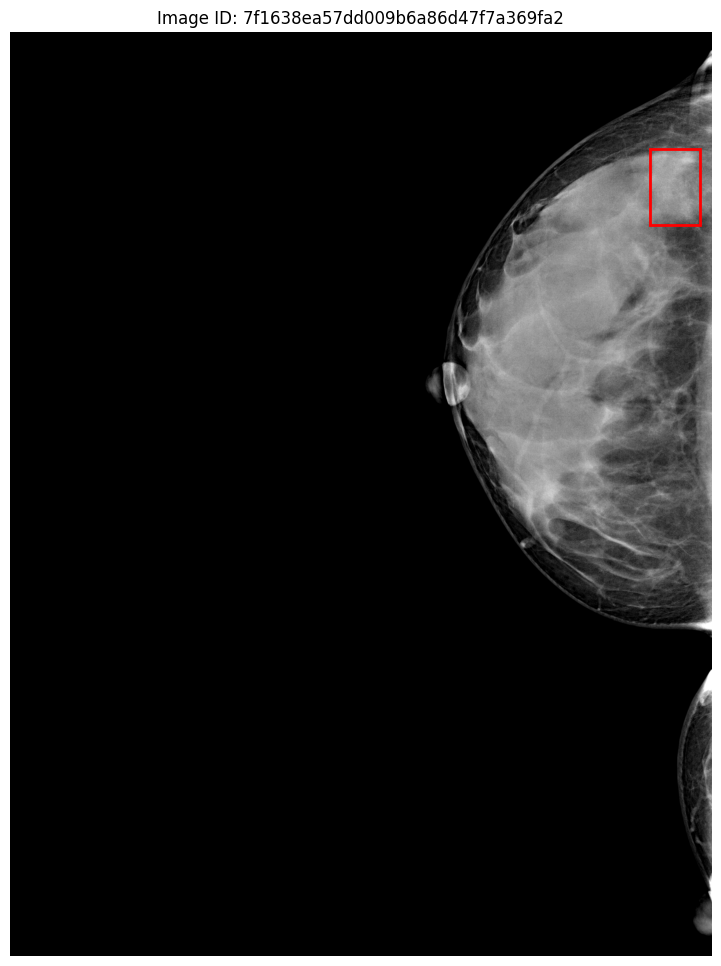

In [165]:
import os
import pydicom
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from pydicom.pixel_data_handlers.util import apply_voi_lut
import ast

# Ruta al dataset DICOM
dicom_root = '/Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/original/Vindrmammo/images'

# Ruta al CSV de anotaciones
annotations_csv = '/Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/original/Vindrmammo/finding_annotations.csv'

# Cargar las anotaciones
findings = pd.read_csv(annotations_csv)

# Convertir la columna 'finding_categories' a listas (si es que están como cadenas)
findings['finding_categories'] = findings['finding_categories'].apply(ast.literal_eval)

# Función para obtener la ruta del archivo DICOM dado el image_id y study_id
def get_dicom_path(image_id, study_id, root_dir):
    return os.path.join(root_dir, study_id, image_id + '.dicom')

# Función para leer el archivo DICOM y aplicar VOI LUT (si está disponible)
def read_dicom_image(image_id, study_id):
    dicom_path = get_dicom_path(image_id, study_id, dicom_root)
    dicom = pydicom.dcmread(dicom_path)
    # Aplicar VOI LUT para ajustar la imagen según el dicom
    image = apply_voi_lut(dicom.pixel_array, dicom)  
    return dicom, image

# Función para dibujar las cajas delimitadoras en la imagen
def draw_bounding_boxes(ax, image_id):
    # Obtener anotaciones para la imagen
    image_annotations = findings[findings['image_id'] == image_id]
    
    for idx, row in image_annotations.iterrows():
        xmin, ymin, xmax, ymax = row['xmin'], row['ymin'], row['xmax'], row['ymax']
        width, height = xmax - xmin, ymax - ymin
        
        # Dibujar la caja delimitadora
        rect = patches.Rectangle((xmin, ymin), width, height, linewidth=2, edgecolor='red', facecolor='none')
        ax.add_patch(rect)

        # Mostrar información de la ROI (opcional)
        print(f"ROI #{idx+1}: {row['finding_categories']}, BIRADS: {row['finding_birads']}")

# Función para filtrar imágenes que NO tengan "No Finding"
def filter_images_with_findings():
    # Filtrar imágenes que no contengan "No Finding" en la lista de categories
    findings_with_finding = findings[findings['finding_categories'].apply(lambda x: 'No Finding' not in x)]
    return findings_with_finding

# Función para mostrar una imagen DICOM aleatoria en alta resolución con ROI
def show_random_dicom_with_roi():
    # Filtrar las filas que NO tengan 'No Finding'
    findings_with_finding = filter_images_with_findings()
    
    if findings_with_finding.empty:
        print("No se encontraron imágenes con findings.")
        return
    
    # Seleccionar una fila aleatoria del dataset filtrado
    random_row = findings_with_finding.sample(n=1).iloc[0]
    
    # Obtener el image_id y study_id de la imagen seleccionada
    image_id = random_row['image_id']
    study_id = random_row['study_id']
    
    print(f"Mostrando imagen aleatoria con ID: {image_id} y Study ID: {study_id}")
    
    # Leer la imagen DICOM
    dicom, image = read_dicom_image(image_id, study_id)
    
    # Mostrar la imagen a alta resolución
    fig, ax = plt.subplots(figsize=(12, 12))  # Tamaño más grande para alta resolución
    ax.imshow(image, cmap='gray')
    
    # Dibujar las cajas delimitadoras en la imagen
    draw_bounding_boxes(ax, image_id)
    
    ax.set_title(f"Image ID: {image_id}")
    ax.axis('off')  # Ocultar los ejes para mejor visualización
    plt.show()

# Mostrar una imagen DICOM aleatoria con su ROI, excluyendo las que tengan "No Finding"
show_random_dicom_with_roi()


Mostrando imagen aleatoria con ID: 1df290db9b7769fabaddab943891889d y Study ID: e0d2978ba3e8b01349861aaeabaa98f9
ROI #878: ['Mass'], BIRADS: BI-RADS 3
ROI #878: ['Mass'], BIRADS: BI-RADS 3
ROI #878: ['Mass'], BIRADS: BI-RADS 3
ROI #878: ['Mass'], BIRADS: BI-RADS 3
ROI #878: ['Mass'], BIRADS: BI-RADS 3
ROI #878: ['Mass'], BIRADS: BI-RADS 3
ROI #878: ['Mass'], BIRADS: BI-RADS 3
ROI #878: ['Mass'], BIRADS: BI-RADS 3
ROI #878: ['Mass'], BIRADS: BI-RADS 3
ROI #878: ['Mass'], BIRADS: BI-RADS 3
ROI #878: ['Mass'], BIRADS: BI-RADS 3
ROI #878: ['Mass'], BIRADS: BI-RADS 3
ROI #878: ['Mass'], BIRADS: BI-RADS 3
ROI #878: ['Mass'], BIRADS: BI-RADS 3
ROI #878: ['Mass'], BIRADS: BI-RADS 3
ROI #878: ['Mass'], BIRADS: BI-RADS 3
ROI #878: ['Mass'], BIRADS: BI-RADS 3
ROI #878: ['Mass'], BIRADS: BI-RADS 3
ROI #878: ['Mass'], BIRADS: BI-RADS 3
ROI #878: ['Mass'], BIRADS: BI-RADS 3
ROI #878: ['Mass'], BIRADS: BI-RADS 3
ROI #878: ['Mass'], BIRADS: BI-RADS 3
ROI #878: ['Mass'], BIRADS: BI-RADS 3
ROI #878: ['M

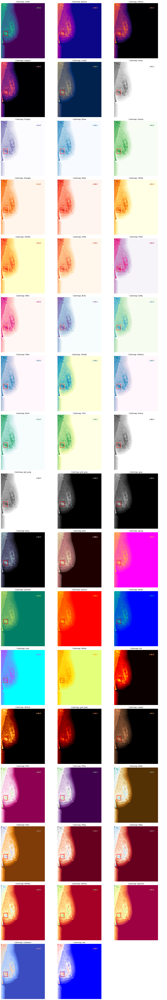

In [150]:
import os
import pydicom
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from pydicom.pixel_data_handlers.util import apply_voi_lut
import ast

# Ruta al dataset DICOM
dicom_root = '/Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/original/Vindrmammo/images'

# Ruta al CSV de anotaciones
annotations_csv = '/Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/original/Vindrmammo/finding_annotations.csv'

# Cargar las anotaciones
findings = pd.read_csv(annotations_csv)

# Convertir la columna 'finding_categories' a listas (si es que están como cadenas)
findings['finding_categories'] = findings['finding_categories'].apply(ast.literal_eval)

# Función para obtener la ruta del archivo DICOM dado el image_id y study_id
def get_dicom_path(image_id, study_id, root_dir):
    return os.path.join(root_dir, study_id, image_id + '.dicom')

# Función para leer el archivo DICOM y aplicar VOI LUT (si está disponible)
def read_dicom_image(image_id, study_id):
    dicom_path = get_dicom_path(image_id, study_id, dicom_root)
    dicom = pydicom.dcmread(dicom_path)
    # Aplicar VOI LUT para ajustar la imagen según el dicom
    image = apply_voi_lut(dicom.pixel_array, dicom)  
    return dicom, image

# Función para dibujar las cajas delimitadoras en la imagen
def draw_bounding_boxes(ax, image_id):
    # Obtener anotaciones para la imagen
    image_annotations = findings[findings['image_id'] == image_id]
    
    for idx, row in image_annotations.iterrows():
        xmin, ymin, xmax, ymax = row['xmin'], row['ymin'], row['xmax'], row['ymax']
        width, height = xmax - xmin, ymax - ymin
        
        # Dibujar la caja delimitadora
        rect = patches.Rectangle((xmin, ymin), width, height, linewidth=2, edgecolor='red', facecolor='none')
        ax.add_patch(rect)

        # Mostrar información de la ROI (opcional)
        print(f"ROI #{idx+1}: {row['finding_categories']}, BIRADS: {row['finding_birads']}")

# Función para filtrar imágenes que NO tengan "No Finding"
def filter_images_with_findings():
    # Filtrar imágenes que no contengan "No Finding" en la lista de categories
    findings_with_finding = findings[findings['finding_categories'].apply(lambda x: 'No Finding' not in x)]
    return findings_with_finding

# Función para mostrar una imagen DICOM aleatoria con varios colormaps
def show_random_dicom_with_multiple_colormaps(colormaps):
    # Filtrar las filas que NO tengan 'No Finding'
    findings_with_finding = filter_images_with_findings()
    
    if findings_with_finding.empty:
        print("No se encontraron imágenes con findings.")
        return
    
    # Seleccionar una fila aleatoria del dataset filtrado
    random_row = findings_with_finding.sample(n=1).iloc[0]
    
    # Obtener el image_id y study_id de la imagen seleccionada
    image_id = random_row['image_id']
    study_id = random_row['study_id']
    
    print(f"Mostrando imagen aleatoria con ID: {image_id} y Study ID: {study_id}")
    
    # Leer la imagen DICOM
    dicom, image = read_dicom_image(image_id, study_id)
    
    # Normalizar la imagen al rango [0, 255] para mejor visualización
    image_normalized = (image - np.min(image)) / (np.max(image) - np.min(image)) * 255
    image_normalized = image_normalized.astype(np.uint8)

    # Configuración del layout para mostrar las imágenes con diferentes colormaps
    n_colormaps = len(colormaps)
    n_cols = 3  # Número de columnas
    n_rows = (n_colormaps // n_cols) + (1 if n_colormaps % n_cols != 0 else 0)
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 6 * n_rows))  # Ajustar el tamaño del gráfico
    axes = axes.ravel()  # Aplanar la matriz de ejes para facilitar el acceso
    
    # Mostrar la imagen con cada colormap
    for i, cmap in enumerate(colormaps):
        ax = axes[i]
        ax.imshow(image_normalized, cmap=cmap)
        draw_bounding_boxes(ax, image_id)  # Dibujar las cajas delimitadoras
        ax.set_title(f"Colormap: {cmap}")
        ax.axis('off')
    
    # Apagar los subplots vacíos
    for i in range(len(colormaps), len(axes)):
        axes[i].axis('off')
    
    plt.tight_layout()
    plt.show()

# Lista de colormaps que quieres visualizar
colormaps = [
    # Perceptually Uniform Sequential
    'viridis', 'plasma', 'inferno', 'magma', 'cividis',

    # Sequential
    'Greys', 'Purples', 'Blues', 'Greens', 'Oranges', 'Reds', 
    'YlOrBr', 'YlOrRd', 'OrRd', 'PuRd', 'RdPu', 'BuPu', 
    'GnBu', 'PuBu', 'YlGnBu', 'PuBuGn', 'BuGn', 'YlGn',

    # Sequential (2)
    'binary', 'gist_yarg', 'gist_gray', 'gray', 'bone', 'pink', 
    'spring', 'summer', 'autumn', 'winter', 'cool', 'Wistia', 
    'hot', 'afmhot', 'gist_heat', 'copper',

    # Diverging
    'PiYG', 'PRGn', 'BrBG', 'PuOr', 'RdGy', 'RdBu', 
    'RdYlBu', 'RdYlGn', 'Spectral', 'coolwarm', 'bwr'
]


# Mostrar una imagen DICOM aleatoria con diferentes colormaps
show_random_dicom_with_multiple_colormaps(colormaps)


Usando Image ID: bfda0deaefee87efb58543e703364a43


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/pydicom/valuerep.py:443: UserWarning: Invalid value for VR UI: 'bfda0deaefee87efb58543e703364a43'. Please see <https://dicom.nema.org/medical/dicom/current/output/html/part05.html#table_6.2-1> for allowed values for each VR.
  warnings.warn(msg)


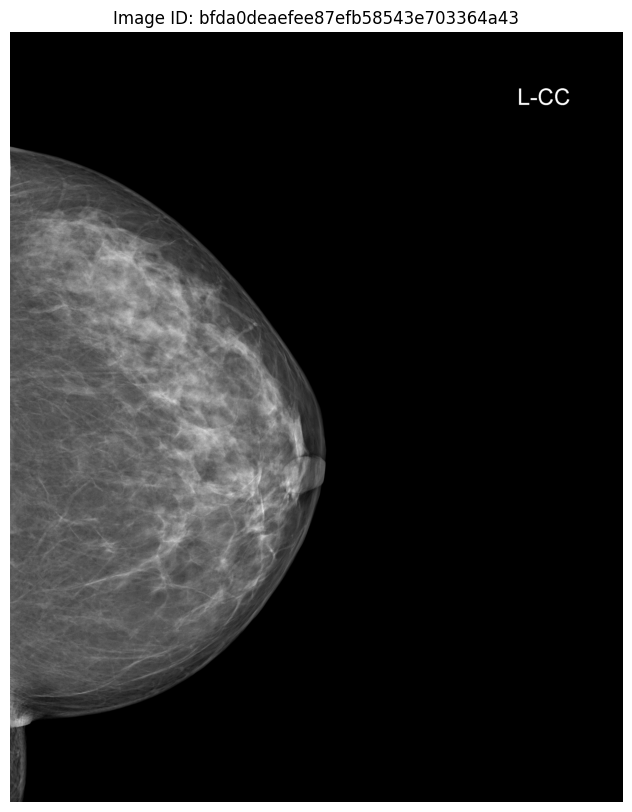

In [168]:
import os
import pydicom
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pydicom.pixel_data_handlers.util import apply_voi_lut

# Ruta al dataset DICOM
dicom_root = '/Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/original/Vindrmammo/images'

# Ruta al archivo CSV de anotaciones
annotations_csv = '/Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/original/Vindrmammo/finding_annotations.csv'

# Ruta al archivo de metadatos CSV
metadata_csv = '/Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/original/Vindrmammo/metadata.csv'

# Cargar el archivo CSV de anotaciones y metadatos
annotations = pd.read_csv(annotations_csv)
metadata = pd.read_csv(metadata_csv)

# Función para obtener la ruta del archivo DICOM usando el `study_id` desde el archivo de anotaciones
def get_dicom_path(image_id, study_id, root_dir):
    dicom_path = os.path.join(root_dir, study_id, image_id + '.dicom')
    if os.path.exists(dicom_path):
        return dicom_path
    else:
        raise FileNotFoundError(f"No se encontró la imagen DICOM: {dicom_path}")

# Función para aplicar el Windowing desde los metadatos
def apply_windowing_from_metadata(dicom, sop_instance_uid):
    row = metadata[metadata['SOP Instance UID'] == sop_instance_uid]
    
    if row.empty:
        raise ValueError(f"No se encontró metadatos para SOP Instance UID: {sop_instance_uid}")
    
    # Obtener Window Center y Window Width desde el CSV
    window_center = float(row.iloc[0]['Window Center'])
    window_width = float(row.iloc[0]['Window Width'])
    
    # Calcular los límites de la ventana
    img_min = window_center - 0.5 - (window_width - 1) / 2
    img_max = window_center - 0.5 + (window_width - 1) / 2
    
    # Aplicar el windowing
    image = dicom.pixel_array
    img_clipped = np.clip(image, img_min, img_max)
    img_normalized = (img_clipped - img_min) / (img_max - img_min) * 255
    img_normalized = img_normalized.astype(np.uint8)
    
    return img_normalized

# Función para mostrar la imagen con Windowing y Bounding Boxes (si hay)
def show_dicom_with_windowing(image_id):
    # Obtener el `study_id` correspondiente al `image_id` desde el archivo de anotaciones
    row = annotations[annotations['image_id'] == image_id]
    if row.empty:
        raise ValueError(f"No se encontró anotaciones para el image_id: {image_id}")
    
    study_id = row.iloc[0]['study_id']
    
    # Obtener el archivo DICOM
    dicom_path = get_dicom_path(image_id, study_id, dicom_root)
    dicom = pydicom.dcmread(dicom_path)
    
    # Aplicar el windowing usando los metadatos
    sop_instance_uid = dicom.SOPInstanceUID
    windowed_image = apply_windowing_from_metadata(dicom, sop_instance_uid)
    
    # Mostrar la imagen con windowing
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(windowed_image, cmap='gray')
    
    # Dibujar las cajas delimitadoras si están disponibles
    image_annotations = annotations[annotations['image_id'] == image_id]
    
    for idx, row in image_annotations.iterrows():
        xmin, ymin, xmax, ymax = row['xmin'], row['ymin'], row['xmax'], row['ymax']
        width, height = xmax - xmin, ymax - ymin
        rect = plt.Rectangle((xmin, ymin), width, height, edgecolor='red', facecolor='none', lw=2)
        ax.add_patch(rect)
    
    ax.set_title(f"Image ID: {image_id}")
    ax.axis('off')
    plt.show()

# Seleccionar un `image_id` válido del archivo de anotaciones
image_id = annotations['image_id'].sample(1).values[0]
print(f"Usando Image ID: {image_id}")

# Mostrar la imagen DICOM con windowing y cajas delimitadoras
show_dicom_with_windowing(image_id)


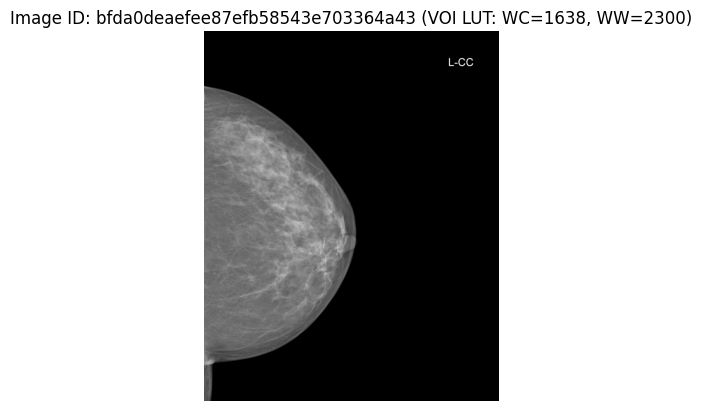

In [184]:
import os
import pydicom
import numpy as np
import matplotlib.pyplot as plt
from pydicom.pixel_data_handlers.util import apply_voi_lut

# Ruta al dataset DICOM
dicom_root = '/Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/original/Vindrmammo/images'

# Función para obtener la ruta del archivo DICOM dado el image_id y study_id
def get_dicom_path(image_id, study_id, root_dir):
    return os.path.join(root_dir, study_id, image_id + '.dicom')

# Función para aplicar windowing manualmente con un VOI LUT estándar
def apply_standard_windowing(image, window_center=50, window_width=400):
    img_min = window_center - 0.5 - (window_width - 1) / 2
    img_max = window_center - 0.5 + (window_width - 1) / 2
    
    # Clippear los valores de pixel para que estén en el rango determinado
    img_clipped = np.clip(image, img_min, img_max)
    
    # Normalizar los valores de pixel al rango [0, 255]
    img_normalized = (img_clipped - img_min) / (img_max - img_min) * 255
    img_normalized = img_normalized.astype(np.uint8)
    
    return img_normalized

# Función para leer el archivo DICOM, aplicar VOI LUT estándar y mostrar la imagen
def process_dicom_with_standard_windowing(image_id, study_id, window_center=50, window_width=400):
    dicom_path = get_dicom_path(image_id, study_id, dicom_root)
    dicom = pydicom.dcmread(dicom_path)
    
    # Obtener la matriz de píxeles del DICOM
    image = dicom.pixel_array
    
    # Aplicar VOI LUT estándar
    processed_image = apply_standard_windowing(image, window_center, window_width)
    
    # Mostrar la imagen resultante
    plt.imshow(processed_image, cmap='gray')
    plt.title(f'Image ID: {image_id} (VOI LUT: WC={window_center}, WW={window_width})')
    plt.axis('off')
    plt.show()

# Prueba con un valor estándar de Window Center y Window Width
image_id = 'bfda0deaefee87efb58543e703364a43'
study_id = '8492112cba1ba5926caf14e5805ef0b3'

# Aquí puedes definir los valores estándar para Window Center y Window Width
standard_window_center = 1638 # Esto puede ser ajustado según tus necesidades
standard_window_width = 2300# Este valor puede variar según la imagen

process_dicom_with_standard_windowing(image_id, study_id, standard_window_center, standard_window_width)


In [189]:
import pandas as pd

# Paths to CSV
metadata_csv = '/Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/original/Vindrmammo/metadata.csv'

# Load the metadata CSV file
metadata_df = pd.read_csv(metadata_csv)

# Count occurrences of unique values in 'Window Center' and 'Window Width'
window_center_counts = metadata_df['Window Center'].value_counts()
window_width_counts = metadata_df['Window Width'].value_counts()

# Display the counts
print("Window Center counts:\n", window_center_counts)
print("\nWindow Width counts:\n", window_width_counts)


Window Center counts:
 Window Center
1653                              192
1648                              176
1660                              171
1657                              169
1675                              166
                                 ... 
[8204, 8204, 8170, 8291, 8347]      1
[8573, 8573, 8540, 8657, 8711]      1
[8175, 8175, 8137, 8272, 8333]      1
[8639, 8639, 8602, 8733, 8793]      1
[8300, 8155, 8120, 8243, 8300]      1
Name: count, Length: 1325, dtype: int64

Window Width counts:
 Window Width
1500                              15244
7296                                 65
7260                                 58
7284                                 56
7276                                 52
                                  ...  
[1928, 1928, 1735, 2120, 2120]        1
[1484, 1484, 1335, 1632, 1632]        1
[1657, 1657, 1491, 1822, 1822]        1
[1603, 1603, 1442, 1763, 1763]        1
[1845, 1758, 1582, 1933, 1845]        1
Name: count, Length: 943, dty

Mostrando imagen con ID: 0bf8c3346bf14a15c7d57c0598c6c370 y Study ID: cc7f62b330b4c61dbb2463d9a5f22010
ROI #18257: ['No Finding'], BIRADS: nan


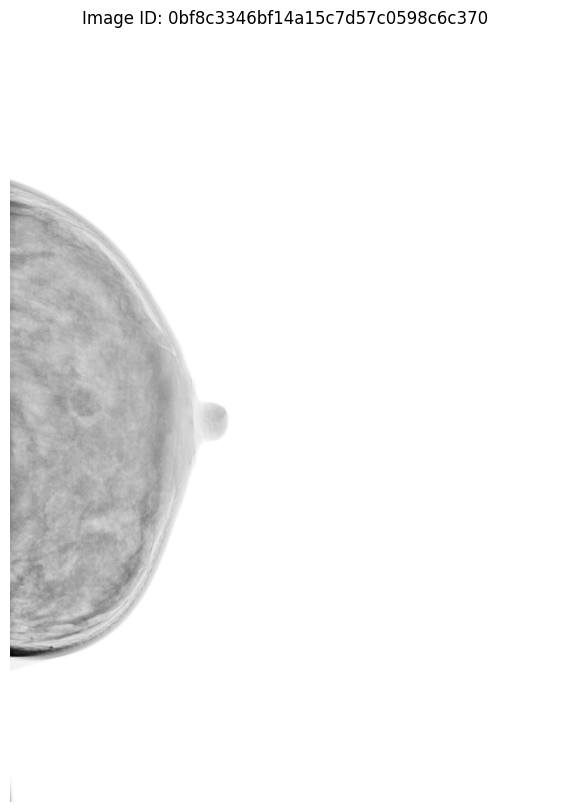

In [216]:
import os
import pydicom
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from pydicom.pixel_data_handlers.util import apply_voi_lut

# Rutas de archivos
dicom_root = '/Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/original/Vindrmammo/images'
annotations_csv = '/Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/original/Vindrmammo/finding_annotations.csv'

# Cargar las anotaciones
findings = pd.read_csv(annotations_csv)

# Función para obtener la ruta del archivo DICOM dado el image_id y study_id
def get_dicom_path(image_id, study_id, root_dir):
    return os.path.join(root_dir, study_id, image_id + '.dicom')

# Función para leer el archivo DICOM y aplicar VOI LUT usando los valores predeterminados del dicom
def read_dicom_image_with_voi(dicom_path):
    dicom = pydicom.dcmread(dicom_path)
    image = apply_voi_lut(dicom.pixel_array, dicom)  # Aplica VOI LUT basado en los metadatos del DICOM
    return dicom, image

# Función para dibujar las cajas delimitadoras en la imagen
def draw_bounding_boxes(ax, image_id):
    # Obtener anotaciones para la imagen
    image_annotations = findings[findings['image_id'] == image_id]
    
    for idx, row in image_annotations.iterrows():
        xmin, ymin, xmax, ymax = row['xmin'], row['ymin'], row['xmax'], row['ymax']
        width, height = xmax - xmin, ymax - ymin
        
        # Dibujar la caja delimitadora
        rect = patches.Rectangle((xmin, ymin), width, height, linewidth=2, edgecolor='red', facecolor='none')
        ax.add_patch(rect)
        
        # Mostrar información de la ROI
        print(f"ROI #{idx+1}: {row['finding_categories']}, BIRADS: {row['finding_birads']}")

# Función para mostrar la imagen DICOM con las ROI (si hay) usando los metadatos predeterminados para el VOI LUT
def show_dicom_with_roi(image_id, study_id):
    # Obtener la ruta del archivo DICOM
    dicom_path = get_dicom_path(image_id, study_id, dicom_root)
    
    # Leer el archivo DICOM y aplicar VOI LUT
    dicom, image = read_dicom_image_with_voi(dicom_path)
    
    # Configurar el gráfico
    fig, ax = plt.subplots(figsize=(10, 10))
    
    # Mostrar la imagen DICOM con ajustes predeterminados
    ax.imshow(image, cmap='gray')
    
    # Dibujar las cajas delimitadoras en la imagen (si hay anotaciones de ROI)
    draw_bounding_boxes(ax, image_id)
    
    # Mostrar el título con el Image ID
    ax.set_title(f"Image ID: {image_id}")
    ax.axis('off')  # Ocultar los ejes para mejor visualización
    plt.show()

# Seleccionar una imagen al azar con anotaciones para visualizar
def show_random_dicom_with_roi():
    random_row = findings.sample(n=1).iloc[0]
    image_id = random_row['image_id']
    study_id = random_row['study_id']
    
    print(f"Mostrando imagen con ID: {image_id} y Study ID: {study_id}")
    
    # Mostrar la imagen con ROI
    show_dicom_with_roi(image_id, study_id)

# Ejecutar la función para mostrar una imagen al azar
show_random_dicom_with_roi()


ROI: ((512, 1292)) ((701, 1485))
ROI Crop: ((475, 1254)) ((738, 1523))
ROI Crop BBOX: ((37, 38)) ((226, 231))


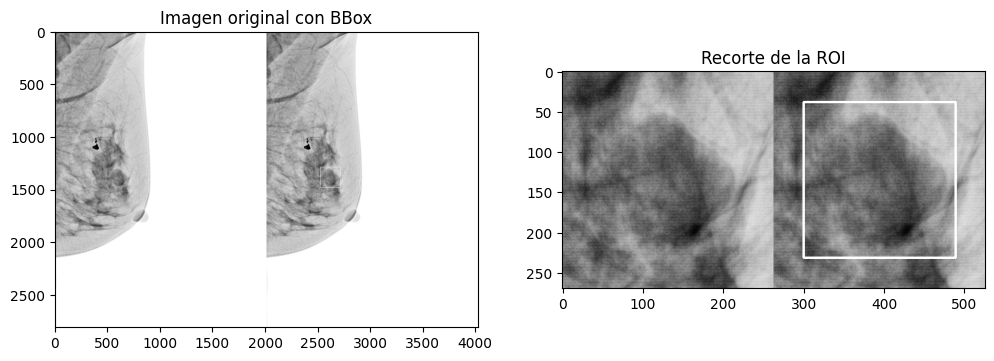

In [56]:
import os
import cv2
import pydicom
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from pydicom.pixel_data_handlers.util import apply_voi_lut

# Definir las rutas específicas
dicom_root = '/Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/original/Vindrmammo/images'
csv_ss1 = '/Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/original/Vindrmammo/finding_annotations.csv'

# Leer las anotaciones CSV que contienen las coordenadas de la ROI
ss1 = pd.read_csv(csv_ss1)

# Función para obtener la ruta de una imagen DICOM usando su image_id
def get_dicom_path(image_id):
    study_id = ss1[ss1['image_id'] == image_id]['study_id'].values[0]
    dicom_path = os.path.join(dicom_root, study_id, image_id + '.dicom')
    return dicom_path

# Función para aplicar windowing y obtener imagenes recortadas (ROI)
def win_operation(image_name):
    image_id = image_name.split('_')[0]
    dicom_path = get_dicom_path(image_id)
    
    # Leer la imagen DICOM
    dicom = pydicom.dcmread(dicom_path)
    img = dicom.pixel_array

    # Extraer Window Center (WC) y Window Width (WW)
    WC = int(dicom.WindowCenter) if dicom.WindowCenter else 40
    WW = int(dicom.WindowWidth) if dicom.WindowWidth else 400

    # Aplicar windowing a la imagen
    img_windowed = np.zeros_like(img, dtype=np.float32)
    ymin, ymax = 0, 255  # Rango de la escala de salida

    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            x = img[i, j]
            if x <= WC - 0.5 - ((WW - 1) / 2):
                img_windowed[i, j] = ymin
            elif x > WC - 0.5 + ((WW - 1) / 2):
                img_windowed[i, j] = ymax
            else:
                img_windowed[i, j] = ((x - (WC - 0.5)) / (WW - 1) + 0.5) * (ymax - ymin) + ymin

    img_windowed = img_windowed.astype(np.uint8)

    # Dibujar la Bounding Box (ROI)
    x1, y1 = (int(ss1.loc[ss1['image_id'] == image_id, 'xmin'].values[0]),
              int(ss1.loc[ss1['image_id'] == image_id, 'ymin'].values[0]))
    x2, y2 = (int(ss1.loc[ss1['image_id'] == image_id, 'xmax'].values[0]),
              int(ss1.loc[ss1['image_id'] == image_id, 'ymax'].values[0]))

    img_windowed_bbox = img_windowed.copy()
    cv2.rectangle(img_windowed_bbox, (x1, y1), (x2, y2), (255, 0, 0), 2)

    # Recortar con margen
    width, height = x2 - x1, y2 - y1
    margin_x, margin_y = int(width * 0.2), int(height * 0.2)

    x1_new = max(x1 - margin_x, 0)
    y1_new = max(y1 - margin_y, 0)
    x2_new = min(x2 + margin_x, img_windowed.shape[1])
    y2_new = min(y2 + margin_y, img_windowed.shape[0])

    print(f"ROI: ({x1, y1}) ({x2, y2})")
    print(f"ROI Crop: ({x1_new, y1_new}) ({x2_new, y2_new})")

    # Recortar la región
    crop = img_windowed[y1_new:y2_new, x1_new:x2_new]

    # Coordenadas trasladadas para la ROI recortada
    x1_translated = x1 - x1_new
    y1_translated = y1 - y1_new
    x2_translated = x2 - x1_new
    y2_translated = y2 - y1_new

    print(f"ROI Crop BBOX: ({x1_translated, y1_translated}) ({x2_translated, y2_translated})")

    crop_bbox = crop.copy()
    cv2.rectangle(crop_bbox, (x1_translated, y1_translated), (x2_translated, y2_translated), (255, 0, 0), 2)

    return img_windowed, img_windowed_bbox, crop, crop_bbox

# Función para mostrar la imagen combinada y las recortadas
def show_cropped_image(image_name):
    img, img_bbox, crop, crop_bbox = win_operation(image_name)

    # Concatenar las imágenes
    combined_image = np.hstack((img, img_bbox))
    combined_image2 = np.hstack((crop, crop_bbox))

    # Mostrar la imagen combinada
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(combined_image, cmap='gray')
    plt.title("Imagen original con BBox")
    
    plt.subplot(1, 2, 2)
    plt.imshow(combined_image2, cmap='gray')
    plt.title("Recorte de la ROI")
    
    plt.show()

# Usar la función para mostrar una imagen aleatoria y recortada
show_cropped_image('1e7ad5577c2f5e49294f9c3660968910')


In [47]:
import os
import cv2
import pydicom
import numpy as np
import pandas as pd
from pydicom.pixel_data_handlers.util import apply_voi_lut

# Rutas al dataset
dicom_root = '/Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/original/Vindrmammo/images'
csv_ss1 = '/Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/processed/subset_datos/ss1.csv'
output_training2 = '/Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/processed/subset_datos/training3'
output_test2 = '/Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/processed/subset_datos/test3'
new_csv_path = '/Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/processed/subset_datos/ss1_rescaled3.csv'

# Leer las anotaciones CSV que contienen las coordenadas de la ROI
ss1 = pd.read_csv(csv_ss1)

# Crear un DataFrame vacío para guardar las nuevas coordenadas (inicializado correctamente aquí)
ss1_rescaled = pd.DataFrame(columns=ss1.columns)

# Crear directorios de salida para training y test
os.makedirs(output_training2, exist_ok=True)
os.makedirs(output_test2, exist_ok=True)

# Tamaño objetivo al que queremos llegar para el recorte (similar a 299x299)
TARGET_SIZE = (299, 299)
MIN_SIZE = 230  # el tamaño objetivo para la imagen sin padding.

# Función para obtener la ruta del archivo DICOM usando image_id
def get_dicom_path(image_id):
    for study_id in os.listdir(dicom_root):
        study_path = os.path.join(dicom_root, study_id)
        if os.path.isdir(study_path):
            dicom_path = os.path.join(study_path, image_id + '.dicom')
            if os.path.exists(dicom_path):
                return dicom_path
    raise FileNotFoundError(f"No se encontró el archivo DICOM para image_id: {image_id}")

# Función para aplicar el recorte basado en el centro de la ROI, con padding variable.
def extract_roi(image_name, split, ss1_rescaled):
    # Obtener el image_id (parte antes del guión bajo "_")
    image_id = image_name.split('_')[0]
    dicom_path = get_dicom_path(image_id)

    # Leer la imagen DICOM
    dicom = pydicom.dcmread(dicom_path)
    img = dicom.pixel_array

    # Aplicar VOI LUT para ajustar la imagen según los metadatos del DICOM
    img_windowed = apply_voi_lut(img, dicom)

    # Normalizar la imagen para que esté en el rango [0, 255]
    img_windowed = (img_windowed - img_windowed.min()) / (img_windowed.max() - img_windowed.min()) * 255
    img_windowed = img_windowed.astype(np.uint8)

    # Extraer las coordenadas de la ROI desde el CSV utilizando el image_name
    try:
        x1, y1 = (int(ss1.loc[ss1['image_name'] == image_name, 'xmin'].values[0]),
                  int(ss1.loc[ss1['image_name'] == image_name, 'ymin'].values[0]))
        x2, y2 = (int(ss1.loc[ss1['image_name'] == image_name, 'xmax'].values[0]),
                  int(ss1.loc[ss1['image_name'] == image_name, 'ymax'].values[0]))
    except IndexError:
        print(f"Error: No se encontraron coordenadas para la ROI de la imagen {image_name}.")
        return ss1_rescaled

    # Verificar que las coordenadas sean válidas
    x1 = max(0, x1)
    y1 = max(0, y1)
    x2 = min(img_windowed.shape[1], x2)
    y2 = min(img_windowed.shape[0], y2)
    
    # Calcular el centro de la ROI
    center_x = (x1 + x2) // 2
    center_y = (y1 + y2) // 2

    # Determinar el tamaño de la ROI original
    width = x2 - x1
    height = y2 - y1

    # Agregar padding variable según el tamaño de la ROI
    if width < MIN_SIZE or height < MIN_SIZE:
        # ROI es más pequeña que el tamaño objetivo, añadimos padding (20%)
        padding_x = int(width * 0.2)
        padding_y = int(height * 0.2)
    else:
        # ROI es mayor, añadimos menos padding (5%)
        padding_x = int(width * 0.05)
        padding_y = int(height * 0.05)

    # Establecer los nuevos límites de la imagen recortada, con padding
    x1_new = max(center_x - (MIN_SIZE // 2) - padding_x, 0)
    y1_new = max(center_y - (MIN_SIZE // 2) - padding_y, 0)
    x2_new = min(center_x + (MIN_SIZE // 2) + padding_x, img_windowed.shape[1])
    y2_new = min(center_y + (MIN_SIZE // 2) + padding_y, img_windowed.shape[0])

    # Recortar la imagen utilizando las nuevas coordenadas ajustadas
    crop = img_windowed[y1_new:y2_new, x1_new:x2_new]

    # Verificar si el recorte no está vacío
    if crop.size == 0:
        print(f"Error: El recorte para la imagen {image_name} está vacío.")
        return ss1_rescaled

    # Redimensionar el recorte a 299x299 píxeles
    try:
        crop_resized = cv2.resize(crop, TARGET_SIZE)
    except cv2.error as e:
        print(f"Error al redimensionar el recorte para la imagen {image_name}: {e}")
        return ss1_rescaled

    # Calcular las nuevas coordenadas reescaladas
    scale_x = TARGET_SIZE[0] / crop.shape[1]  # Relación entre el tamaño original y el tamaño redimensionado
    scale_y = TARGET_SIZE[1] / crop.shape[0]

    xmin_rescaled = int((x1 - x1_new) * scale_x)
    ymin_rescaled = int((y1 - y1_new) * scale_y)
    xmax_rescaled = int((x2 - x1_new) * scale_x)
    ymax_rescaled = int((y2 - y1_new) * scale_y)

    # Guardar el ROI redimensionado en la carpeta correspondiente a 'train' o 'test'
    if split == 'training':
        output_dir = output_training2
    else:
        output_dir = output_test2

    roi_filename = f"{image_name}.png"
    output_path = os.path.join(output_dir, roi_filename)
    cv2.imwrite(output_path, crop_resized)

    # Guardar las coordenadas reescaladas en el nuevo CSV
    new_row = ss1.loc[ss1['image_name'] == image_name].copy()
    new_row['xmin'] = xmin_rescaled
    new_row['ymin'] = ymin_rescaled
    new_row['xmax'] = xmax_rescaled
    new_row['ymax'] = ymax_rescaled
    ss1_rescaled = pd.concat([ss1_rescaled, new_row], ignore_index=True)

    print(f"Imagen ROI guardada en: {output_path}")
    
    return ss1_rescaled

# Función para recorrer todas las imágenes del CSV y guardar las ROI redimensionadas y las nuevas coordenadas
def process_all_images():
    global ss1_rescaled
    for _, row in ss1.iterrows():
        image_name = row['image_name']
        split = row['split']  # la columna 'split' tiene los valores 'train' o 'test'
        ss1_rescaled = extract_roi(image_name, split, ss1_rescaled)

    # Guardar el nuevo CSV con las coordenadas reescaladas
    ss1_rescaled.to_csv(new_csv_path, index=False)
    print(f"Nuevo CSV guardado en: {new_csv_path}")

# Ejecutar el procesamiento de todas las imágenes
process_all_images()

Imagen ROI guardada en: /Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/processed/subset_datos/training3/4e3a578fe535ea4f5258d3f7f4419db8_0.png
Imagen ROI guardada en: /Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/processed/subset_datos/training3/dac39351b0f3a8c670b7f8dc88029364_0.png
Imagen ROI guardada en: /Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/processed/subset_datos/test3/2f944efb1cb9579442df2d7fe6a579b7_0.png
Imagen ROI guardada en: /Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/processed/subset_datos/test3/7385e8cf7b29764525c81de4aa1aebe4_0.png
Imagen ROI guardada en: /Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/processed/subset_datos/training3/5a94dd668eaa9865b907450c37db6ecc_0.png
Imagen ROI guardada en: /Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/processed/subset_datos/training3/2bbe58aab434b2a6af7e873ca9adc56d_0.png
Imagen ROI guardada en: /Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preproc

In [85]:
import os
import random
import cv2
import pandas as pd
import matplotlib.pyplot as plt

# Rutas a las carpetas de 'training' y 'training2'
training_dir = '/Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/processed/subset_datos/training'
training2_dir = '/Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/processed/subset_datos/training3'

# Ruta al nuevo CSV con las coordenadas reescaladas
csv_rescaled = '/Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/processed/subset_datos/ss1_rescaled3.csv'

# Leer el CSV con las coordenadas reescaladas
ss1_rescaled = pd.read_csv(csv_rescaled)

# Función para seleccionar una imagen al azar con el mismo nombre en ambas carpetas
def get_random_image_name(training_dir, training2_dir):
    # Obtener lista de imágenes en cada carpeta
    training_images = set(os.listdir(training_dir))
    training2_images = set(os.listdir(training2_dir))
    
    # Encontrar los nombres de las imágenes comunes en ambas carpetas
    common_images = list(training_images.intersection(training2_images))
    
    if not common_images:
        raise ValueError("No se encontraron imágenes comunes en ambas carpetas.")
    
    # Seleccionar una imagen al azar de las comunes
    random_image = random.choice(common_images)
    return random_image

# Función para cargar y devolver las dos imágenes de ambas carpetas
def load_images(image_name):
    img1_path = os.path.join(training_dir, image_name)
    img2_path = os.path.join(training2_dir, image_name)
    
    # Cargar las imágenes
    img1 = cv2.imread(img1_path, cv2.IMREAD_GRAYSCALE)  # Cargar en escala de grises
    img2 = cv2.imread(img2_path, cv2.IMREAD_GRAYSCALE)  # Cargar en escala de grises
    
    return img1, img2

# Función para obtener las coordenadas reescaladas del bounding box para una imagen
def get_bbox(image_name):
    # Buscar la fila correspondiente al `image_name` en el CSV
    coordenadas = ss1_rescaled[ss1_rescaled['image_name'] == image_name.replace('.png', '')]
    if coordenadas.empty:
        print(f"No se encontraron coordenadas para la imagen {image_name}.")
        return None
    
    # Extraer las coordenadas xmin, ymin, xmax, ymax
    xmin = int(coordenadas['xmin'].values[0])
    ymin = int(coordenadas['ymin'].values[0])
    xmax = int(coordenadas['xmax'].values[0])
    ymax = int(coordenadas['ymax'].values[0])
    
    return xmin, ymin, xmax, ymax

# Función para visualizar las dos imágenes lado a lado y dibujar el bounding box en la imagen del segundo enfoque
def plot_images_with_bbox(img1, img2, image_name):
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    
    # Mostrar la imagen 1 (training)
    axes[0].imshow(img1, cmap='gray')
    axes[0].set_title(f"Imagen en training: {image_name}", fontsize=10)  # Ajustar el tamaño del texto
    axes[0].axis('off')
    
    # Mostrar la imagen 2 (training2) con el bounding box
    axes[1].imshow(img2, cmap='gray')
    
    # Obtener y dibujar el bounding box en la imagen de training2
    bbox = get_bbox(image_name)
    if bbox:
        xmin, ymin, xmax, ymax = bbox
        # Dibujar la bounding box en la imagen del segundo enfoque (training2)
        rect = plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, linewidth=2, edgecolor='r', facecolor='none')
        axes[1].add_patch(rect)
    
    axes[1].set_title(f"Imagen en training2: {image_name}", fontsize=10)  # Ajustar el tamaño del texto
    axes[1].axis('off')
    
    plt.tight_layout()
    plt.show()

# Función principal para comparar imágenes
def compare_random_images():
    # Obtener una imagen al azar que esté en ambas carpetas
    random_image_name = get_random_image_name(training_dir, training2_dir)
    print(f"Comparando la imagen: {random_image_name}")
    
    # Cargar las imágenes
    img1, img2 = load_images(random_image_name)
    
    # Comprobar si las imágenes se cargaron correctamente
    if img1 is None or img2 is None:
        print(f"Error al cargar la imagen {random_image_name}.")
        return
    
    # Ploteamos las imágenes lado a lado para compararlas, incluyendo el bounding box en training2
    plot_images_with_bbox(img1, img2, random_image_name)

# Ejecutar la comparación
compare_random_images()


KeyError: 'image_name'

Archivo DICOM seleccionado aleatoriamente: /Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/original/Vindrmammo/images/a4d12ca2beaf6714f136cdb1370b84fc/9bbe1f4397d945131ba1833914b9bc13.dicom
Bits por píxel: 16
Rango de valores de píxeles: 1100 - 10000
Rango de valores de píxeles después de aplicar VOI LUT: 10066.820276497694 - 65535.0


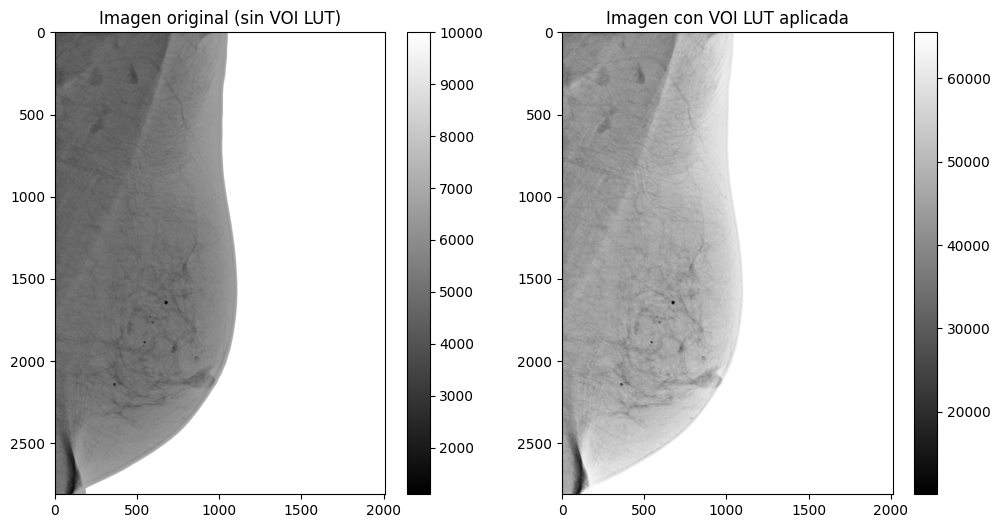

In [57]:
import os
import pydicom
import random
from pydicom.pixel_data_handlers.util import apply_voi_lut
import numpy as np
import matplotlib.pyplot as plt

# Función para buscar de manera aleatoria un archivo DICOM en el directorio y subdirectorios
def find_random_dicom(dicom_root):
    dicom_files = []
    
    # Recorrer el directorio y subdirectorios buscando archivos DICOM
    for root, dirs, files in os.walk(dicom_root):
        for file in files:
            if file.endswith('.dicom'):  # Filtrar solo archivos con extensión .dicom
                dicom_files.append(os.path.join(root, file))
    
    # Si no hay archivos DICOM encontrados
    if not dicom_files:
        raise FileNotFoundError(f"No se encontraron archivos DICOM en el directorio: {dicom_root}")
    
    # Elegir un archivo DICOM de manera aleatoria
    random_dicom = random.choice(dicom_files)
    print(f"Archivo DICOM seleccionado aleatoriamente: {random_dicom}")
    
    return random_dicom

# Función para cargar la imagen DICOM y obtener información
def analyze_dicom_image(dicom_path):
    # Leer el archivo DICOM
    dicom = pydicom.dcmread(dicom_path)
    
    # Obtener la imagen como array de píxeles
    img = dicom.pixel_array
    
    # Obtener bits por píxel
    bits_per_pixel = dicom.BitsStored
    print(f"Bits por píxel: {bits_per_pixel}")
    
    # Obtener rango de valores de píxeles
    pixel_min = np.min(img)
    pixel_max = np.max(img)
    print(f"Rango de valores de píxeles: {pixel_min} - {pixel_max}")
    
    # Aplicar VOI LUT (si está disponible en los metadatos del DICOM)
    try:
        img_voi = apply_voi_lut(img, dicom)
        voi_min = np.min(img_voi)
        voi_max = np.max(img_voi)
        print(f"Rango de valores de píxeles después de aplicar VOI LUT: {voi_min} - {voi_max}")
    except AttributeError:
        print("VOI LUT no disponible en este archivo DICOM.")
        img_voi = img  # Usar la imagen original si no hay VOI LUT
    
    # Mostrar la imagen original y la imagen después de aplicar VOI LUT
    plt.figure(figsize=(12, 6))
    
    # Imagen original
    plt.subplot(1, 2, 1)
    plt.title('Imagen original (sin VOI LUT)')
    plt.imshow(img, cmap='gray')
    plt.colorbar()
    
    # Imagen con VOI LUT
    plt.subplot(1, 2, 2)
    plt.title('Imagen con VOI LUT aplicada')
    plt.imshow(img_voi, cmap='gray')
    plt.colorbar()
    
    plt.show()

# Ruta al directorio principal que contiene las imágenes DICOM
dicom_root = '/Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/original/Vindrmammo/images'

# Buscar y seleccionar de manera aleatoria un archivo DICOM
random_dicom_path = find_random_dicom(dicom_root)

# Ejecutar el análisis en la imagen DICOM seleccionada aleatoriamente
analyze_dicom_image(random_dicom_path)


In [32]:
import os
import pandas as pd
import numpy as np

# Ruta donde se encuentra el archivo finding_annotations.csv
csv_path = '/Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/processed/subset_datos/ss1_rescaled.csv'

# Leer el archivo CSV
def read_findings(csv_path):
    # Cargar el archivo CSV
    try:
        df = pd.read_csv(csv_path)
        print(f"Archivo CSV '{csv_path}' cargado correctamente.")
    except FileNotFoundError:
        print(f"Archivo CSV '{csv_path}' no encontrado.")
        return None
    
    return df

# Obtener rango de valores para xmin, ymin, xmax, ymax
def get_coordinate_ranges(df):
    # Calcular los mínimos y máximos de las coordenadas
    xmin_min, xmin_max = df['xmin'].min(), df['xmin'].max()
    ymin_min, ymin_max = df['ymin'].min(), df['ymin'].max()
    xmax_min, xmax_max = df['xmax'].min(), df['xmax'].max()
    ymax_min, ymax_max = df['ymax'].min(), df['ymax'].max()
    
    # Imprimir los rangos de las coordenadas
    print(f"Rango de valores 'xmin': {xmin_min} - {xmin_max}")
    print(f"Rango de valores 'ymin': {ymin_min} - {ymin_max}")
    print(f"Rango de valores 'xmax': {xmax_min} - {xmax_max}")
    print(f"Rango de valores 'ymax': {ymax_min} - {ymax_max}")

# Comprobar si el padding se realiza antes o después de la normalización
def check_padding_in_code():
    print("\nAnalizando si el padding se aplica antes o después de la normalización...\n")
    
    # Código simplificado para verificar la secuencia
    def normalize(image):
        return (image - np.min(image)) / (np.max(image) - np.min(image))
    
    def add_padding(crop, padding_x, padding_y):
        # Simulación de cómo se agregaría padding
        padded_image = np.pad(crop, ((padding_y, padding_y), (padding_x, padding_x)), mode='constant', constant_values=0)
        return padded_image

    # Ejemplo de flujo del código
    image = np.random.randint(0, 255, (500, 500))  # Simulación de una imagen de 500x500 píxeles
    padding_x, padding_y = 20, 20
    crop = image[100:400, 100:400]  # Ejemplo de recorte

    # Flujo 1: Padding antes de normalizar
    crop_with_padding_first = add_padding(crop, padding_x, padding_y)
    normalized_first = normalize(crop_with_padding_first)

    # Flujo 2: Normalizar antes de agregar padding
    normalized_first_then_padding = normalize(crop)
    crop_with_padding_last = add_padding(normalized_first_then_padding, padding_x, padding_y)

    print("Padding aplicado ANTES de normalizar:\n", crop_with_padding_first)
    print("\nPadding aplicado DESPUÉS de normalizar:\n", crop_with_padding_last)

# Leer el CSV de anotaciones y obtener los rangos de coordenadas
df_findings = read_findings(csv_path)
if df_findings is not None:
    get_coordinate_ranges(df_findings)

# Verificar si el padding se realiza antes o después de la normalización en el código
check_padding_in_code()


Archivo CSV '/Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/processed/subset_datos/ss1_rescaled.csv' cargado correctamente.
Rango de valores 'xmin': -47 - 239
Rango de valores 'ymin': -123 - 145
Rango de valores 'xmax': 54 - 346
Rango de valores 'ymax': 153 - 423

Analizando si el padding se aplica antes o después de la normalización...

Padding aplicado ANTES de normalizar:
 [[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]

Padding aplicado DESPUÉS de normalizar:
 [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


Estadísticas de Anchos:
  - Ancho mínimo: 24.219970703200033 px
  - Ancho máximo: 947.712318420413 px
  - Ancho promedio: 225.02 px

Estadísticas de Alturas:
  - Altura mínima: 16.21997070309999 px
  - Altura máxima: 1350.3000488281 px
  - Altura promedio: 236.03 px


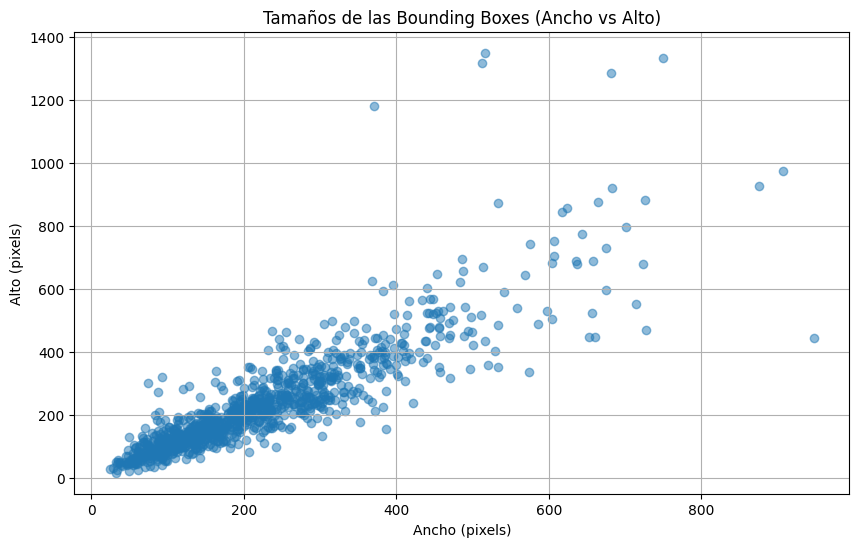

In [33]:
import pandas as pd
import matplotlib.pyplot as plt

# Ruta al archivo CSV con las coordenadas reescaladas
csv_rescaled =  '/Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/processed/subset_datos/ss1.csv'

# Leer el archivo CSV
ss1_rescaled = pd.read_csv(csv_rescaled)

# Función para calcular el tamaño de la bounding box de todas las imágenes
def calculate_bbox_sizes(df):
    # Crear listas para almacenar los tamaños
    widths = []
    heights = []
    
    # Recorrer todas las filas del DataFrame y calcular el tamaño de las bounding boxes
    for _, row in df.iterrows():
        xmin = row['xmin']
        ymin = row['ymin']
        xmax = row['xmax']
        ymax = row['ymax']
        
        # Calcular el ancho y el alto de la bounding box
        width = xmax - xmin
        height = ymax - ymin
        
        # Almacenar los tamaños
        widths.append(width)
        heights.append(height)
    
    return widths, heights

# Función para visualizar los tamaños
def plot_bbox_sizes(widths, heights):
    # Crear un scatter plot de ancho vs alto
    plt.figure(figsize=(10, 6))
    plt.scatter(widths, heights, alpha=0.5)
    plt.title('Tamaños de las Bounding Boxes (Ancho vs Alto)')
    plt.xlabel('Ancho (pixels)')
    plt.ylabel('Alto (pixels)')
    plt.grid(True)
    plt.show()

# Función para generar un resumen estadístico
def print_bbox_statistics(widths, heights):
    # Calcular estadísticas básicas
    print("Estadísticas de Anchos:")
    print(f"  - Ancho mínimo: {min(widths)} px")
    print(f"  - Ancho máximo: {max(widths)} px")
    print(f"  - Ancho promedio: {sum(widths) / len(widths):.2f} px")
    
    print("\nEstadísticas de Alturas:")
    print(f"  - Altura mínima: {min(heights)} px")
    print(f"  - Altura máxima: {max(heights)} px")
    print(f"  - Altura promedio: {sum(heights) / len(heights):.2f} px")

# Calcular los tamaños de las bounding boxes
widths, heights = calculate_bbox_sizes(ss1_rescaled)

# Imprimir estadísticas de los tamaños de bounding boxes
print_bbox_statistics(widths, heights)

# Visualizar los tamaños de las bounding boxes
plot_bbox_sizes(widths, heights)


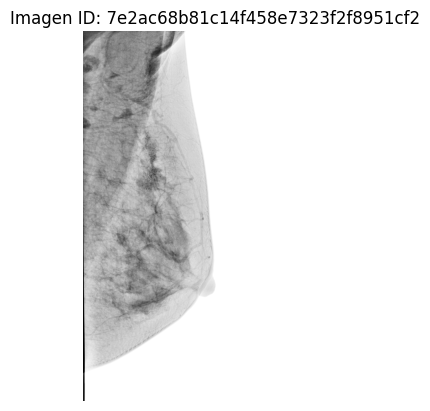

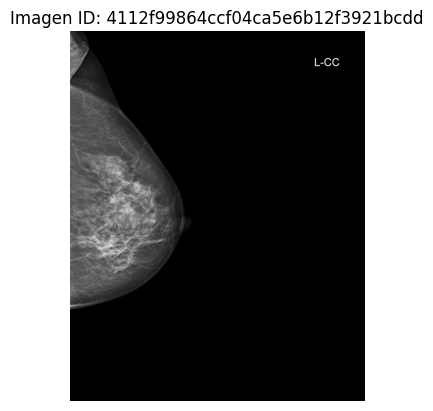

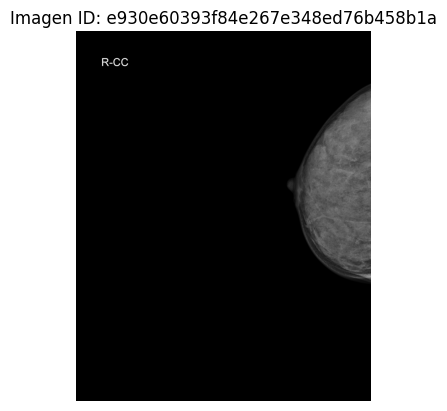

In [54]:
import os
import pydicom
import matplotlib.pyplot as plt
from pydicom.pixel_data_handlers.util import apply_voi_lut

# Ruta al dataset de DICOMs
dicom_root = '/Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/original/Vindrmammo/images'

# Función para obtener la ruta del archivo DICOM usando el image_id
def get_dicom_path(image_id):
    for study_id in os.listdir(dicom_root):
        study_path = os.path.join(dicom_root, study_id)
        if os.path.isdir(study_path):
            dicom_path = os.path.join(study_path, image_id + '.dicom')
            if os.path.exists(dicom_path):
                return dicom_path
    raise FileNotFoundError(f"No se encontró el archivo DICOM para image_id: {image_id}")

# Función para leer la imagen DICOM y aplicarle el VOI LUT si está presente
def read_dicom_image(image_id):
    dicom_path = get_dicom_path(image_id)
    dicom = pydicom.dcmread(dicom_path)

    # Aplicar VOI LUT si está disponible
    image = apply_voi_lut(dicom.pixel_array, dicom)
    
    # Normalizar la imagen para que esté en el rango [0, 255]
    #image = (image - image.min()) / (image.max() - image.min()) * 255
    #image = image.astype('uint8')

    return image

# Función para visualizar la imagen
def show_dicom_image(image_id):
    # Leer la imagen DICOM
    image = read_dicom_image(image_id)
    
    # Mostrar la imagen usando matplotlib
    plt.imshow(image, cmap='gray')
    plt.title(f"Imagen ID: {image_id}")
    plt.axis('off')  # Ocultar los ejes
    plt.show()

# Ejemplo: Mostrar una imagen DICOM dado su image_id
#image_id = '7e2ac68b81c14f458e7323f2f8951cf2'  # Reemplaza con el image_id que quieras visualizar
show_dicom_image('7e2ac68b81c14f458e7323f2f8951cf2')
show_dicom_image('4112f99864ccf04ca5e6b12f3921bcdd')
show_dicom_image('e930e60393f84e267e348ed76b458b1a')


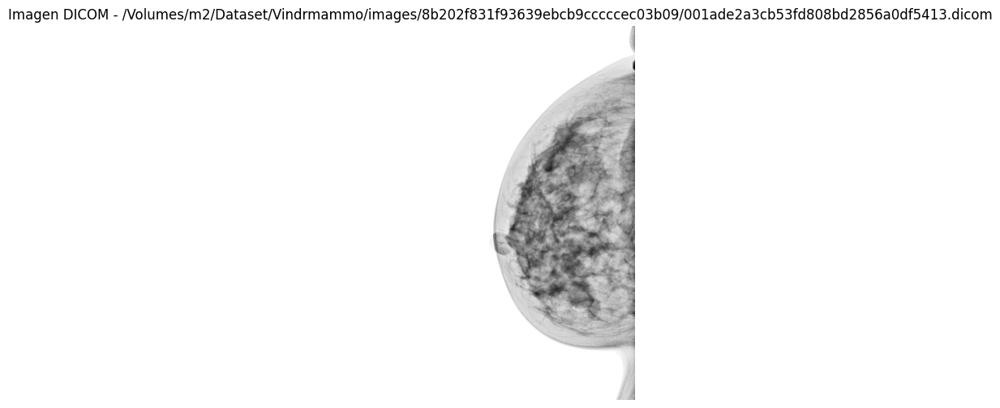

In [66]:
dicom_root = '/Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/original/Vindrmammo/images'
import pydicom
import matplotlib.pyplot as plt

def visualizar_dicom(ruta_archivo, cmap='gray', aplicar_voi_lut=True):
    """
    Función para visualizar una imagen DICOM.

    Parámetros:
    ruta_archivo (str): Ruta al archivo DICOM.
    cmap (str): Mapa de colores a utilizar en la visualización. Por defecto es 'gray' para imágenes en escala de grises.
    aplicar_voi_lut (bool): Indica si se debe aplicar la transformación VOI LUT. Por defecto es True.

    """
    # Leer el archivo DICOM
    dicom = pydicom.dcmread(ruta_archivo)

    # Función para aplicar la transformación VOI LUT si es necesaria
    def get_pixel_array(dicom, aplicar_voi_lut=True):
        if aplicar_voi_lut:
            return pydicom.pixel_data_handlers.apply_voi_lut(dicom.pixel_array, dicom)
        else:
            return dicom.pixel_array

    # Obtener los datos de píxeles
    pixel_array = get_pixel_array(dicom, aplicar_voi_lut)
    
    # Configurar el tamaño del gráfico
    plt.figure(figsize=(6, 6))
    
    # Mostrar la imagen
    plt.imshow(pixel_array, cmap=cmap)
    plt.title(f'Imagen DICOM - {ruta_archivo}')
    plt.axis('off')  # Ocultar los ejes
    plt.show()

# Ejemplo de uso
visualizar_dicom('/Volumes/m2/Dataset/Vindrmammo/images/8b202f831f93639ebcb9cccccec03b09/001ade2a3cb53fd808bd2856a0df5413.dicom')


In [ ]:
from pydicom.pixel_data_handlers.util import apply_voi_lut

# Función para mostrar una imagen DICOM con VOI LUT aplicado
def show_dicom_image(dicom_path, title):
    dicom = pydicom.dcmread(dicom_path)

    # Aplicar VOI LUT si está disponible
    if 'WindowCenter' in dicom and 'WindowWidth' in dicom:
        img = apply_voi_lut(dicom.pixel_array, dicom)
    else:
        img = dicom.pixel_array

    # Mostrar la imagen
    plt.imshow(img, cmap='gray')
    plt.title(title, fontsize=10)
    plt.axis('off')
    plt.show()


In [73]:
import os
import pydicom
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from pydicom.pixel_data_handlers.util import apply_voi_lut
import pandas as pd
import numpy as np
import cv2

# Ruta a las imágenes DICOM y el CSV
dicom_root = '/Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/original/Vindrmammo/images'
csv_path = '/Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/original/Vindrmammo/finding_annotations.csv'

# Cargar el CSV que contiene las anotaciones
findings = pd.read_csv(csv_path)

# Función para obtener la ruta del archivo DICOM usando image_id
def get_path(image_id):
    row = findings[findings['image_id'] == image_id]
    if not row.empty:
        row = row.iloc[0].squeeze()
        study_id = row['study_id']
        path = os.path.join(dicom_root, study_id, image_id + '.dicom')
        return path
    else:
        raise ValueError(f"No se encontró ninguna entrada para el image_id: {image_id}")

# Función para cargar y mostrar una imagen DICOM con ROI y metadatos
def show_image(image_id, cmap='gray', bbox=True, metadata=True, finding=None):
    # Filtrar los datos correspondientes al image_id
    if finding:
        row = findings.loc[(findings['image_id'] == image_id) & (findings['finding_categories'] == finding)]
        row.reset_index(inplace=True, drop=True)
    else:
        row = findings.loc[findings['image_id'] == image_id]
        row.reset_index(inplace=True, drop=True)

    # Obtener la ruta del archivo DICOM
    image_path = get_path(image_id)
    dicom = pydicom.dcmread(image_path)

    # Aplicar VOI LUT si es necesario
    arr = apply_voi_lut(dicom.pixel_array, dicom)

    # Crear la figura y el eje
    fig, ax = plt.subplots()
    ax.imshow(arr, cmap=cmap)

    # Colores para dibujar las ROI
    colors = ["red", "blue", "green", "orange", "purple", "cyan", "magenta", "yellow", "pink", 'brown']

    # Verificar si hay findings (hallazgos)
    if len(row) == 0:
        print("No findings")

    # Dibujar las ROI y mostrar los metadatos
    for index, item in row.iterrows():
        if metadata:
            print(
                f"{index + 1} - {colors[index]} - finding_categories: {row.loc[index]['finding_categories']}, "
                f"\nfinding_birads: {row.loc[index]['finding_birads']}, "
                f"breast_birads: {row.loc[index]['breast_birads']}, "
                f"Photometric Interpretation: {dicom.PhotometricInterpretation}"
            )

        # Coordenadas del rectángulo (ROI)
        x1, y1 = row['xmin'].values[index], row['ymin'].values[index]
        x2, y2 = row['xmax'].values[index], row['ymax'].values[index]
        width = x2 - x1
        height = y2 - y1

        # Dibujar el rectángulo (ROI) en la imagen
        rect = patches.Rectangle((x1, y1), width, height, linewidth=1, edgecolor=colors[index], facecolor='none')
        if bbox:
            ax.add_patch(rect)

    # Mostrar la imagen
    plt.axis('off')
    plt.show()

# Función para realizar operaciones de ventana (Windowing)
def win_operation(image_id):
    image_path = get_path(image_id)
    dicom = pydicom.dcmread(image_path)
    img = dicom.pixel_array

    # Extraer Window Center y Window Width
    WC = dicom.WindowCenter
    WW = dicom.WindowWidth

    img_windowed = np.zeros_like(img, dtype=np.float32)
    ymin = 0  # Mínimo valor en la escala de salida
    ymax = 255  # Máximo valor en la escala de salida

    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            x = img[i, j]
            if x <= WC - 0.5 - ((WW - 1) / 2):
                img_windowed[i, j] = ymin
            elif x > WC - 0.5 + ((WW - 1) / 2):
                img_windowed[i, j] = ymax
            else:
                img_windowed[i, j] = ((x - (WC - 0.5)) / (WW - 1) + 0.5) * (ymax - ymin) + ymin

    img_windowed = img_windowed.astype(np.uint8)

    # Dibujar Bounding Box (ROI)
    x1, y1 = int(findings.loc[findings['image_id'] == image_id, 'xmin'].values[0]), int(findings.loc[findings['image_id'] == image_id, 'ymin'].values[0])
    x2, y2 = int(findings.loc[findings['image_id'] == image_id, 'xmax'].values[0]), int(findings.loc[findings['image_id'] == image_id, 'ymax'].values[0])
    cv2.rectangle(img_windowed, (x1, y1), (x2, y2), (255, 0, 0), 2)

    # Mostrar la imagen con Windowing aplicado y ROI
    plt.imshow(img_windowed, cmap='gray')
    plt.title(f'Windowed Image with ROI: {image_id}')
    plt.axis('off')
    plt.show()

# Ejemplo de uso
image_id = 'your_image_id_here'  # Reemplaza con un image_id válido
show_image(image_id)
win_operation(image_id)


ValueError: No se encontró ninguna entrada para el image_id: your_image_id_here

Mostrando imagen DICOM al azar: /Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/original/Vindrmammo/images/fb6a80caea4f811816a7129f3496b1ea/beb09ac44253164d81d03d50894d42c0.dicom


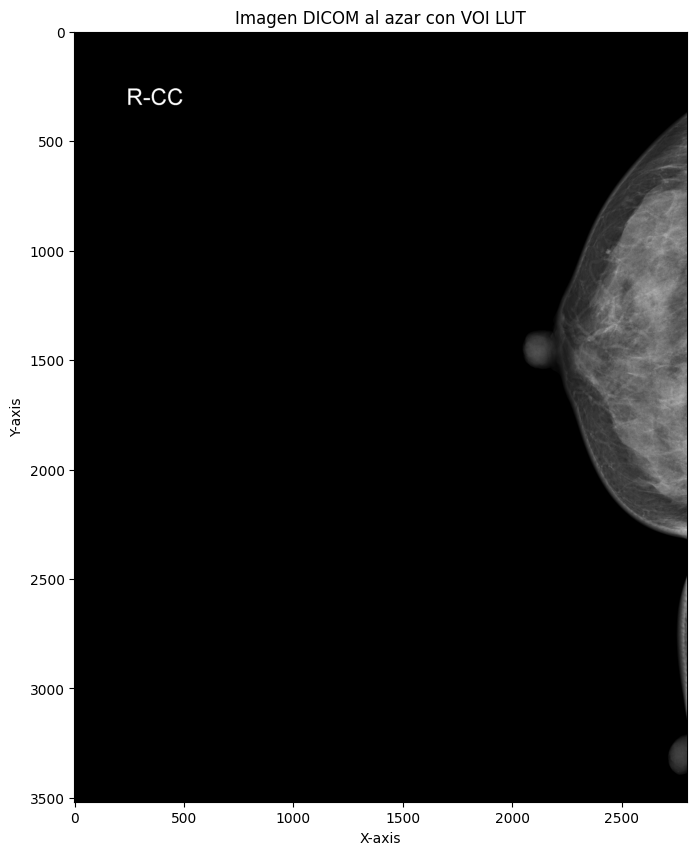

In [135]:
import os
import random
import pydicom
import matplotlib.pyplot as plt
from pydicom.pixel_data_handlers.util import apply_voi_lut

# Ruta a la carpeta de imágenes DICOM
dicom_root = '/Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/original/Vindrmammo/images'

# Función para obtener una ruta DICOM al azar
def get_random_dicom_path(dicom_root):
    # Obtener una lista de todas las subcarpetas (study_id) en el directorio raíz
    study_ids = [d for d in os.listdir(dicom_root) if os.path.isdir(os.path.join(dicom_root, d))]
    
    if not study_ids:
        raise FileNotFoundError("No se encontraron carpetas en la ruta del dicom_root.")

    # Elegir una carpeta (study_id) al azar
    random_study = random.choice(study_ids)
    study_path = os.path.join(dicom_root, random_study)

    # Obtener una lista de todos los archivos DICOM en la carpeta elegida
    dicom_files = [f for f in os.listdir(study_path) if f.endswith('.dicom')]

    if not dicom_files:
        raise FileNotFoundError(f"No se encontraron archivos DICOM en la carpeta {study_path}.")

    # Elegir un archivo DICOM al azar
    random_dicom_file = random.choice(dicom_files)
    return os.path.join(study_path, random_dicom_file)

# Función para mostrar una imagen DICOM aplicando VOI LUT
def show_dicom_image_with_voi_lut(dicom_path, title):
    dicom = pydicom.dcmread(dicom_path)
    
    # Aplicar VOI LUT si está disponible
    if 'WindowCenter' in dicom and 'WindowWidth' in dicom:
        image = apply_voi_lut(dicom.pixel_array, dicom)
    else:
        image = dicom.pixel_array
    
    # Mostrar la imagen en un tamaño más grande con los ejes visibles
    plt.figure(figsize=(10, 10))
    plt.imshow(image, cmap='gray')
    plt.title(title, fontsize=12)
    plt.xlabel('X-axis')
    plt.ylabel('Y-axis')
    plt.show()

# Obtener una ruta de un archivo DICOM al azar
random_dicom_path = get_random_dicom_path(dicom_root)

# Mostrar la imagen DICOM seleccionada al azar con VOI LUT
print(f"Mostrando imagen DICOM al azar: {random_dicom_path}")
show_dicom_image_with_voi_lut(random_dicom_path, f"Imagen DICOM al azar con VOI LUT")


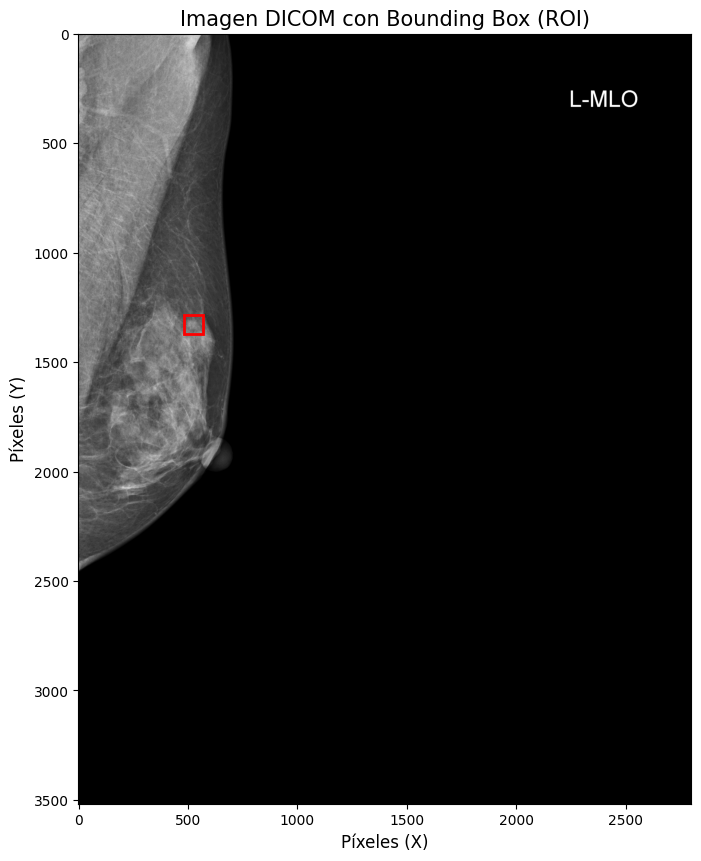

In [123]:
import os
import pydicom
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import pandas as pd
from pydicom.pixel_data_handlers.util import apply_voi_lut

# Ruta al CSV filtrado y la carpeta de imágenes DICOM
filtered_csv_path = '/Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/processed/csv/filtered_mass_calcifications.csv'
dicom_root = '/Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/original/Vindrmammo/images'

# Cargar el CSV filtrado
filtered_df = pd.read_csv(filtered_csv_path)

# Función para obtener la ruta del archivo DICOM usando SOP Instance UID
def get_dicom_path(sop_instance_uid):
    for study_id in os.listdir(dicom_root):
        study_path = os.path.join(dicom_root, study_id)
        if os.path.isdir(study_path):
            dicom_path = os.path.join(study_path, sop_instance_uid + '.dicom')
            if os.path.exists(dicom_path):
                return dicom_path
    raise FileNotFoundError(f"No se encontró el archivo DICOM para SOP Instance UID: {sop_instance_uid}")

# Función para mostrar la imagen DICOM y añadir una bounding box
def show_dicom_image_with_bbox(dicom_path, findings):
    dicom = pydicom.dcmread(dicom_path)
    img = apply_voi_lut(dicom.pixel_array, dicom)
    
    # Crear la figura y los ejes para la visualización en grande
    fig, ax = plt.subplots(figsize=(10, 10))  # Imagen grande

    # Mostrar la imagen en escala de grises
    ax.imshow(img, cmap='gray')

    # Añadir bounding box para el primer finding de la imagen
    if not findings.empty:
        row = findings.iloc[0]  # Tomar la primera fila de findings
        x1, y1 = int(row['xmin']), int(row['ymin'])
        x2, y2 = int(row['xmax']), int(row['ymax'])

        # Calcular el ancho y alto del rectángulo (ROI)
        width, height = x2 - x1, y2 - y1

        # Crear un rectángulo con las coordenadas de la ROI
        rect = patches.Rectangle((x1, y1), width, height, linewidth=2, edgecolor='red', facecolor='none')
        ax.add_patch(rect)

    # Etiquetar los ejes
    ax.set_xlabel('Píxeles (X)', fontsize=12)
    ax.set_ylabel('Píxeles (Y)', fontsize=12)

    # Añadir un título a la imagen
    ax.set_title('Imagen DICOM con Bounding Box (ROI)', fontsize=15)

    # Mostrar la imagen con bounding box
    plt.show()

# Seleccionar una imagen al azar de MONOCHROME2
random_row = filtered_df[filtered_df['Photometric Interpretation'] == 'MONOCHROME2'].sample(1).iloc[0]

# Obtener el SOP Instance UID y el nombre de la imagen
sop_uid = random_row['SOP Instance UID']
image_name = random_row['image_id']

# Obtener la ruta DICOM para la imagen seleccionada
dicom_path = get_dicom_path(sop_uid)

# Filtrar los findings correspondientes a esa imagen
findings = filtered_df[filtered_df['image_id'] == image_name]

# Mostrar la imagen DICOM con el bounding box
show_dicom_image_with_bbox(dicom_path, findings)


ValueError: cannot convert float NaN to integer

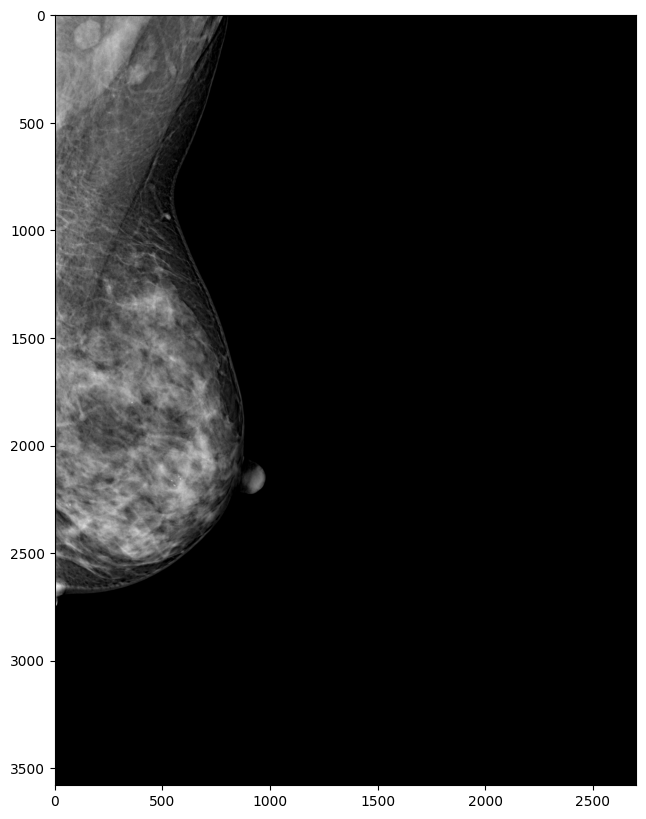

In [109]:
import os
import pydicom
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import pandas as pd
from pydicom.pixel_data_handlers.util import apply_voi_lut

# Ruta al CSV de anotaciones de findings y la carpeta de imágenes DICOM
finding_csv_path = '/Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/original/Vindrmammo/finding_annotations.csv'
dicom_root = '/Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/original/Vindrmammo/images'

# Cargar el CSV de anotaciones (finding_annotations.csv)
finding_df = pd.read_csv(finding_csv_path)

# Función para obtener la ruta del archivo DICOM usando image_id
def get_dicom_path(image_id):
    # Buscar en todas las subcarpetas de dicom_root
    for study_id in os.listdir(dicom_root):
        study_path = os.path.join(dicom_root, study_id)
        if os.path.isdir(study_path):
            dicom_path = os.path.join(study_path, image_id + '.dicom')
            if os.path.exists(dicom_path):
                return dicom_path
    raise FileNotFoundError(f"No se encontró el archivo DICOM para image_id: {image_id}")

# Función para mostrar la imagen DICOM y añadir una bounding box
def show_dicom_image_with_bbox(dicom_path, findings):
    dicom = pydicom.dcmread(dicom_path)
    img = apply_voi_lut(dicom.pixel_array, dicom)
    
    # Crear la figura y los ejes para la visualización en grande
    fig, ax = plt.subplots(figsize=(10, 10))  # Imagen grande

    # Mostrar la imagen en escala de grises
    ax.imshow(img, cmap='gray')

    # Añadir bounding box para el primer finding de la imagen
    row = findings.iloc[0]  # Tomar la primera fila de findings
    x1, y1 = int(row['xmin']), int(row['ymin'])
    x2, y2 = int(row['xmax']), int(row['ymax'])

    # Calcular el ancho y alto del rectángulo (ROI)
    width, height = x2 - x1, y2 - y1

    # Crear un rectángulo con las coordenadas de la ROI
    rect = patches.Rectangle((x1, y1), width, height, linewidth=2, edgecolor='red', facecolor='none')
    ax.add_patch(rect)

    # Etiquetar los ejes
    ax.set_xlabel('Píxeles (X)', fontsize=12)
    ax.set_ylabel('Píxeles (Y)', fontsize=12)

    # Añadir un título a la imagen
    ax.set_title('Imagen DICOM con Bounding Box (ROI)', fontsize=15)

    # Mostrar la imagen con bounding box
    plt.show()

# Seleccionar una fila al azar del dataframe de findings
random_row = finding_df.sample(1).iloc[0]

# Obtener el image_id
image_id = random_row['image_id']

# Obtener la ruta DICOM para la imagen seleccionada
dicom_path = get_dicom_path(image_id)

# Filtrar los findings correspondientes a esa imagen
findings = finding_df[finding_df['image_id'] == image_id]

# Mostrar la imagen DICOM con el bounding box
show_dicom_image_with_bbox(dicom_path, findings)


Mostrando imagen DICOM al azar: /Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/original/Vindrmammo/images/5e3216db19aa93c7e397e29a7ede3ea8/32e01a034bcaa80bf0705edf2df04863.dicom


ValueError: cannot convert float NaN to integer

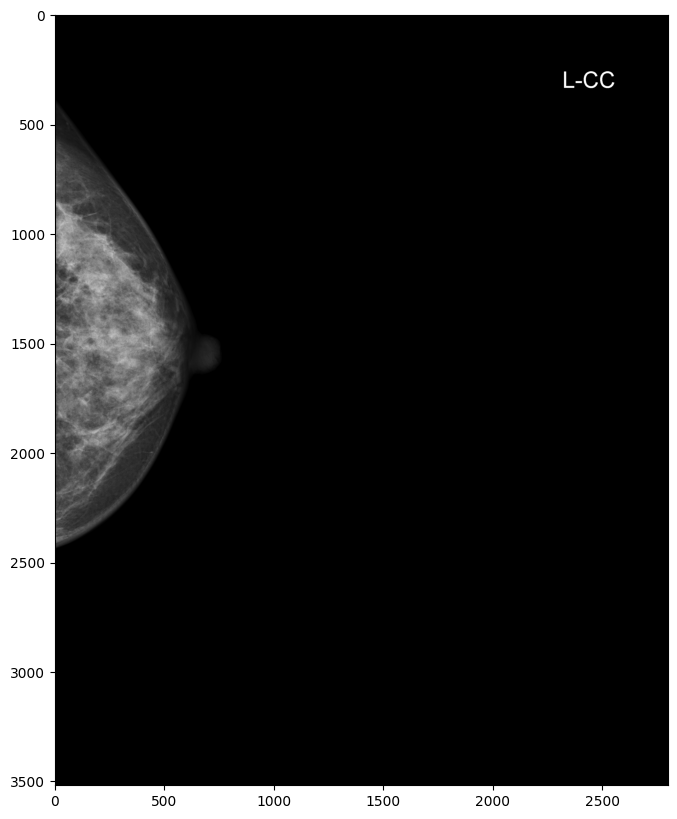

In [113]:
import os
import random
import pydicom
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from pydicom.pixel_data_handlers.util import apply_voi_lut
import pandas as pd

# Ruta al CSV de anotaciones de findings y la carpeta de imágenes DICOM
finding_csv_path = '/Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/original/Vindrmammo/finding_annotations.csv'
dicom_root = '/Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/original/Vindrmammo/images'

# Cargar el CSV de anotaciones (finding_annotations.csv)
finding_df = pd.read_csv(finding_csv_path)

# Función para obtener una ruta DICOM al azar
def get_random_dicom_path(dicom_root):
    # Obtener una lista de todas las subcarpetas (study_id) en el directorio raíz
    study_ids = [d for d in os.listdir(dicom_root) if os.path.isdir(os.path.join(dicom_root, d))]
    
    if not study_ids:
        raise FileNotFoundError("No se encontraron carpetas en la ruta del dicom_root.")

    # Elegir una carpeta (study_id) al azar
    random_study = random.choice(study_ids)
    study_path = os.path.join(dicom_root, random_study)

    # Obtener una lista de todos los archivos DICOM en la carpeta elegida
    dicom_files = [f for f in os.listdir(study_path) if f.endswith('.dicom')]

    if not dicom_files:
        raise FileNotFoundError(f"No se encontraron archivos DICOM en la carpeta {study_path}.")

    # Elegir un archivo DICOM al azar
    random_dicom_file = random.choice(dicom_files)
    return os.path.join(study_path, random_dicom_file)

# Función para mostrar una imagen DICOM y añadir una bounding box
def show_dicom_image_with_bbox(dicom_path, findings, title):
    dicom = pydicom.dcmread(dicom_path)
    
    # Aplicar VOI LUT si está disponible
    if 'WindowCenter' in dicom and 'WindowWidth' in dicom:
        image = apply_voi_lut(dicom.pixel_array, dicom)
    else:
        image = dicom.pixel_array
    
    # Crear la figura y los ejes para la visualización en grande
    fig, ax = plt.subplots(figsize=(10, 10))  # Imagen grande

    # Mostrar la imagen en escala de grises
    ax.imshow(image, cmap='gray')

    # Añadir bounding box para el primer finding de la imagen
    row = findings.iloc[0]  # Tomar la primera fila de findings
    x1, y1 = int(row['xmin']), int(row['ymin'])
    x2, y2 = int(row['xmax']), int(row['ymax'])

    # Calcular el ancho y alto del rectángulo (ROI)
    width, height = x2 - x1, y2 - y1

    # Crear un rectángulo con las coordenadas de la ROI
    rect = patches.Rectangle((x1, y1), width, height, linewidth=2, edgecolor='red', facecolor='none')
    ax.add_patch(rect)

    # Etiquetar los ejes
    ax.set_xlabel('X-axis', fontsize=12)
    ax.set_ylabel('Y-axis', fontsize=12)

    # Añadir un título a la imagen
    ax.set_title(title, fontsize=15)

    # Mostrar la imagen con bounding box
    plt.show()

# Obtener una ruta de un archivo DICOM al azar
random_dicom_path = get_random_dicom_path(dicom_root)

# Seleccionar una fila al azar del dataframe de findings
random_row = finding_df[finding_df['image_id'] == os.path.basename(random_dicom_path).split('.')[0]].sample(1).iloc[0]

# Filtrar los findings correspondientes a esa imagen
findings = finding_df[finding_df['image_id'] == os.path.basename(random_dicom_path).split('.')[0]]

# Mostrar la imagen DICOM con el bounding box
print(f"Mostrando imagen DICOM al azar: {random_dicom_path}")
show_dicom_image_with_bbox(random_dicom_path, findings, 'Imagen DICOM al azar con Bounding Box')


Mostrando imagen DICOM al azar: /Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/original/Vindrmammo/images/89492e570a0878fd24813c616f3d4bf2/76ddc239893720ed1478ad39dbe02870.dicom


ValueError: cannot convert float NaN to integer

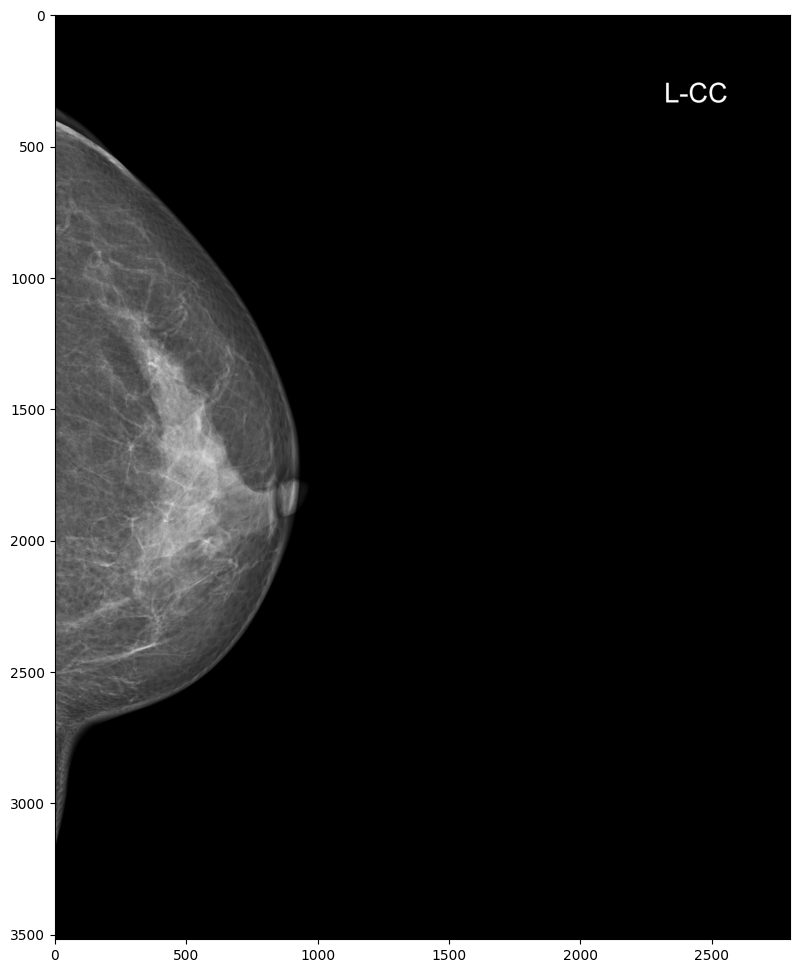

In [122]:
import os
import random
import pydicom
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from pydicom.pixel_data_handlers.util import apply_voi_lut
import pandas as pd

# Ruta al CSV de anotaciones de findings y la carpeta de imágenes DICOM
finding_csv_path = '/Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/original/Vindrmammo/finding_annotations.csv'
dicom_root = '/Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/original/Vindrmammo/images'

# Cargar el CSV de anotaciones (finding_annotations.csv)
finding_df = pd.read_csv(finding_csv_path)

# Función para obtener una ruta DICOM al azar
def get_random_dicom_path(dicom_root):
    # Obtener una lista de todas las subcarpetas (study_id) en el directorio raíz
    study_ids = [d for d in os.listdir(dicom_root) if os.path.isdir(os.path.join(dicom_root, d))]
    
    if not study_ids:
        raise FileNotFoundError("No se encontraron carpetas en la ruta del dicom_root.")

    # Elegir una carpeta (study_id) al azar
    random_study = random.choice(study_ids)
    study_path = os.path.join(dicom_root, random_study)

    # Obtener una lista de todos los archivos DICOM en la carpeta elegida
    dicom_files = [f for f in os.listdir(study_path) if f.endswith('.dicom')]

    if not dicom_files:
        raise FileNotFoundError(f"No se encontraron archivos DICOM en la carpeta {study_path}.")

    # Elegir un archivo DICOM al azar
    random_dicom_file = random.choice(dicom_files)
    return os.path.join(study_path, random_dicom_file)

# Función para mostrar una imagen DICOM y añadir una bounding box
def show_dicom_image_with_bbox(dicom_path, findings, title):
    dicom = pydicom.dcmread(dicom_path)
    
    # Aplicar VOI LUT si está disponible
    if 'WindowCenter' in dicom and 'WindowWidth' in dicom:
        image = apply_voi_lut(dicom.pixel_array, dicom)
    else:
        image = dicom.pixel_array
    
    # Crear la figura y los ejes para la visualización en grande
    fig, ax = plt.subplots(figsize=(12, 12))  # Imagen grande

    # Mostrar la imagen en escala de grises
    ax.imshow(image, cmap='gray')

    # Añadir bounding box para todos los findings de la imagen
    for _, row in findings.iterrows():
        x1, y1 = int(row['xmin']), int(row['ymin'])
        x2, y2 = int(row['xmax']), int(row['ymax'])

        # Asegurarse de que las coordenadas estén dentro del rango de la imagen
        x1 = max(0, x1)
        y1 = max(0, y1)
        x2 = min(image.shape[1], x2)
        y2 = min(image.shape[0], y2)

        # Calcular el ancho y alto del rectángulo (ROI)
        width, height = x2 - x1, y2 - y1

        # Crear un rectángulo con las coordenadas de la ROI
        rect = patches.Rectangle((x1, y1), width, height, linewidth=2, edgecolor='red', facecolor='none')
        ax.add_patch(rect)

    # Etiquetar los ejes
    ax.set_xlabel('Píxeles (X)', fontsize=12)
    ax.set_ylabel('Píxeles (Y)', fontsize=12)

    # Añadir un título a la imagen
    ax.set_title(title, fontsize=15)

    # Mostrar la imagen con bounding box
    plt.show()

# Obtener una ruta de un archivo DICOM al azar
random_dicom_path = get_random_dicom_path(dicom_root)

# Seleccionar una fila al azar del dataframe de findings que corresponde a la imagen seleccionada
image_id = os.path.basename(random_dicom_path).split('.')[0]
findings = finding_df[finding_df['image_id'] == image_id]

# Mostrar la imagen DICOM con el bounding box
print(f"Mostrando imagen DICOM al azar: {random_dicom_path}")
show_dicom_image_with_bbox(random_dicom_path, findings, 'Imagen DICOM al azar con Bounding Box')


In [133]:
import os
import random
import pandas as pd
import pydicom
import matplotlib.pyplot as plt
from pydicom.pixel_data_handlers.util import apply_voi_lut
import matplotlib.patches as patches


csv_path = '/Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/processed/csv/combined_annotations_metadata.csv'
dicom_root = '/Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/original/Vindrmammo/images'

# Cargar el archivo CSV
df_annotations = pd.read_csv(csv_path)

# Función para obtener un dicom_path basado en el CSV
def get_random_dicom_path_from_csv(dicom_root, df):
    # Elegir una fila al azar del CSV
    random_row = df.sample(n=1).iloc[0]
    
    # Obtener el 'series_id' y 'image_id' de la fila seleccionada
    study_id = random_row['series_id']
    image_id = random_row['image_id']
    
    # Crear la ruta completa al archivo DICOM
    dicom_path = os.path.join(dicom_root, study_id, f"{image_id}.dicom")
    
    # Verificar si el archivo DICOM existe
    if not os.path.exists(dicom_path):
        raise FileNotFoundError(f"No se encontró el archivo DICOM: {dicom_path}")
    
    # Extraer las coordenadas de la bounding box si existen
    if all(col in random_row for col in ['xmin', 'ymin', 'xmax', 'ymax']):
        bbox = (random_row['xmin'], random_row['ymin'], random_row['xmax'], random_row['ymax'])
    else:
        bbox = None

    return dicom_path, bbox

# Función para mostrar la imagen DICOM con la bounding box, si está disponible
def show_dicom_image_with_bbox(dicom_path, bbox, title):
    dicom = pydicom.dcmread(dicom_path)
    
    # Aplicar VOI LUT si está disponible
    if 'WindowCenter' in dicom and 'WindowWidth' in dicom:
        image = apply_voi_lut(dicom.pixel_array, dicom)
    else:
        image = dicom.pixel_array
    
    # Mostrar la imagen en un tamaño más grande con los ejes visibles
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(image, cmap='gray')
    plt.title(title, fontsize=12)
    plt.xlabel('X-axis')
    plt.ylabel('Y-axis')
    
    # Dibujar la bounding box si está presente
    if bbox is not None:
        xmin, ymin, xmax, ymax = bbox
        width = xmax - xmin
        height = ymax - ymin
        rect = patches.Rectangle((xmin, ymin), width, height, linewidth=2, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
    
    plt.show()

# Obtener una ruta de un archivo DICOM al azar desde el CSV
random_dicom_path, random_bbox = get_random_dicom_path_from_csv(dicom_root, df_annotations)

# Mostrar la imagen DICOM seleccionada al azar con la bounding box si está disponible
print(f"Mostrando imagen DICOM al azar: {random_dicom_path}")
show_dicom_image_with_bbox(random_dicom_path, random_bbox, f"Imagen DICOM al azar con bounding box")


FileNotFoundError: No se encontró el archivo DICOM: /Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/original/Vindrmammo/images/f29c35a85a46021185c270aef3b914a8/b2ff054048b31dd46e6ba0e057d5b3f8.dicom

Mostrando imagen DICOM al azar: /Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/original/Vindrmammo/images/5daa7f91a089d754d6e2f45d358d1574/c3d0ce8b0547c5c197549d8f0ffe60f5.dicom


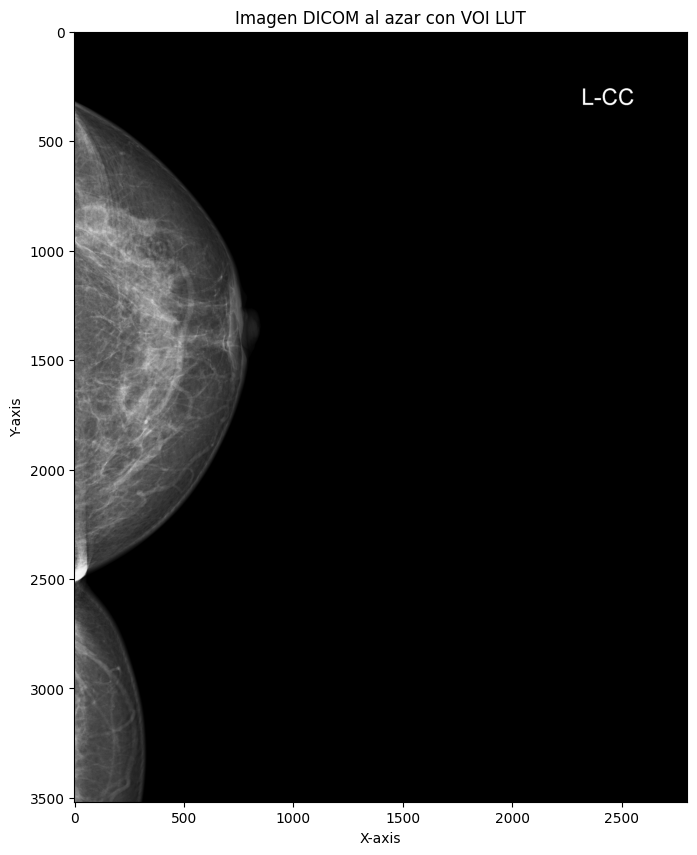

Mostrando imagen DICOM al azar: /Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/original/Vindrmammo/images/0a42c6ff59b652c12aa5a784fffa97c4/5335b81f00d4608d8ab9d6cbdb73b965.dicom


ValueError: cannot convert float NaN to integer

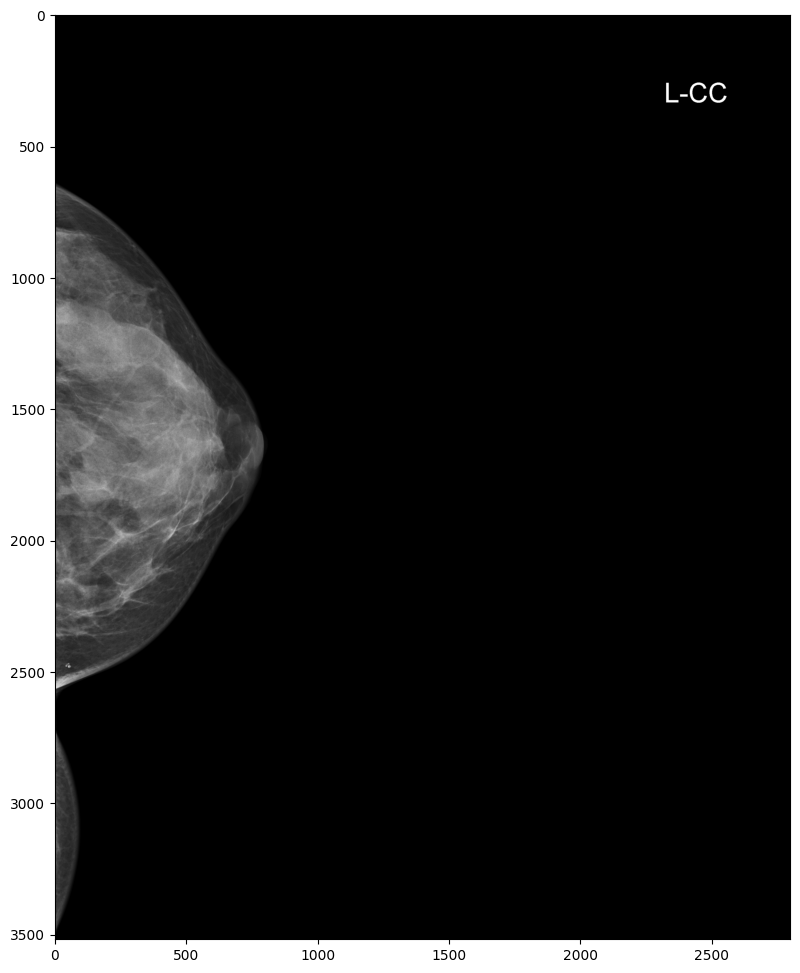

In [160]:
import os
import random
import pydicom
import matplotlib.pyplot as plt
from pydicom.pixel_data_handlers.util import apply_voi_lut

# Ruta a la carpeta de imágenes DICOM
dicom_root = '/Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/original/Vindrmammo/images'

# Función para obtener una ruta DICOM al azar
def get_random_dicom_path(dicom_root):
    # Obtener una lista de todas las subcarpetas (study_id) en el directorio raíz
    study_ids = [d for d in os.listdir(dicom_root) if os.path.isdir(os.path.join(dicom_root, d))]
    
    if not study_ids:
        raise FileNotFoundError("No se encontraron carpetas en la ruta del dicom_root.")

    # Elegir una carpeta (study_id) al azar
    random_study = random.choice(study_ids)
    study_path = os.path.join(dicom_root, random_study)

    # Obtener una lista de todos los archivos DICOM en la carpeta elegida
    dicom_files = [f for f in os.listdir(study_path) if f.endswith('.dicom')]

    if not dicom_files:
        raise FileNotFoundError(f"No se encontraron archivos DICOM en la carpeta {study_path}.")

    # Elegir un archivo DICOM al azar
    random_dicom_file = random.choice(dicom_files)
    return os.path.join(study_path, random_dicom_file)

# Función para mostrar una imagen DICOM aplicando VOI LUT
def show_dicom_image_with_voi_lut(dicom_path, title):
    dicom = pydicom.dcmread(dicom_path)
    
    # Aplicar VOI LUT si está disponible
    if 'WindowCenter' in dicom and 'WindowWidth' in dicom:
        image = apply_voi_lut(dicom.pixel_array, dicom)
    else:
        image = dicom.pixel_array
    
    # Mostrar la imagen en un tamaño más grande con los ejes visibles
    plt.figure(figsize=(10, 10))
    plt.imshow(image, cmap='gray')
    plt.title(title, fontsize=12)
    plt.xlabel('X-axis')
    plt.ylabel('Y-axis')
    plt.show()

# Obtener una ruta de un archivo DICOM al azar
random_dicom_path = get_random_dicom_path(dicom_root)

# Mostrar la imagen DICOM seleccionada al azar con VOI LUT
print(f"Mostrando imagen DICOM al azar: {random_dicom_path}")
show_dicom_image_with_voi_lut(random_dicom_path, f"Imagen DICOM al azar con VOI LUT")
import os
import random
import pydicom
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from pydicom.pixel_data_handlers.util import apply_voi_lut
import pandas as pd

# Ruta al CSV de anotaciones de findings y la carpeta de imágenes DICOM
finding_csv_path = '/Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/original/Vindrmammo/finding_annotations.csv'
dicom_root = '/Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/original/Vindrmammo/images'

# Cargar el CSV de anotaciones (finding_annotations.csv)
finding_df = pd.read_csv(finding_csv_path)

# Función para obtener una ruta DICOM al azar
def get_random_dicom_path(dicom_root):
    # Obtener una lista de todas las subcarpetas (study_id) en el directorio raíz
    study_ids = [d for d in os.listdir(dicom_root) if os.path.isdir(os.path.join(dicom_root, d))]
    
    if not study_ids:
        raise FileNotFoundError("No se encontraron carpetas en la ruta del dicom_root.")

    # Elegir una carpeta (study_id) al azar
    random_study = random.choice(study_ids)
    study_path = os.path.join(dicom_root, random_study)

    # Obtener una lista de todos los archivos DICOM en la carpeta elegida
    dicom_files = [f for f in os.listdir(study_path) if f.endswith('.dicom')]

    if not dicom_files:
        raise FileNotFoundError(f"No se encontraron archivos DICOM en la carpeta {study_path}.")

    # Elegir un archivo DICOM al azar
    random_dicom_file = random.choice(dicom_files)
    return os.path.join(study_path, random_dicom_file)

# Función para mostrar una imagen DICOM y añadir una bounding box
def show_dicom_image_with_bbox(dicom_path, findings, title):
    dicom = pydicom.dcmread(dicom_path)
    
    # Aplicar VOI LUT si está disponible
    if 'WindowCenter' in dicom and 'WindowWidth' in dicom:
        image = apply_voi_lut(dicom.pixel_array, dicom)
    else:
        image = dicom.pixel_array
    
    # Crear la figura y los ejes para la visualización en grande
    fig, ax = plt.subplots(figsize=(12, 12))  # Imagen grande

    # Mostrar la imagen en escala de grises
    ax.imshow(image, cmap='gray')

    # Añadir bounding box para todos los findings de la imagen
    for _, row in findings.iterrows():
        x1, y1 = int(row['xmin']), int(row['ymin'])
        x2, y2 = int(row['xmax']), int(row['ymax'])

        # Asegurarse de que las coordenadas estén dentro del rango de la imagen
        x1 = max(0, x1)
        y1 = max(0, y1)
        x2 = min(image.shape[1], x2)
        y2 = min(image.shape[0], y2)

        # Calcular el ancho y alto del rectángulo (ROI)
        width, height = x2 - x1, y2 - y1

        # Crear un rectángulo con las coordenadas de la ROI
        rect = patches.Rectangle((x1, y1), width, height, linewidth=2, edgecolor='red', facecolor='none')
        ax.add_patch(rect)

    # Etiquetar los ejes
    ax.set_xlabel('Píxeles (X)', fontsize=12)
    ax.set_ylabel('Píxeles (Y)', fontsize=12)

    # Añadir un título a la imagen
    ax.set_title(title, fontsize=15)

    # Mostrar la imagen con bounding box
    plt.show()

# Obtener una ruta de un archivo DICOM al azar
random_dicom_path = get_random_dicom_path(dicom_root)

# Seleccionar una fila al azar del dataframe de findings que corresponde a la imagen seleccionada
image_id = os.path.basename(random_dicom_path).split('.')[0]
findings = finding_df[finding_df['image_id'] == image_id]

# Mostrar la imagen DICOM con el bounding box
print(f"Mostrando imagen DICOM al azar: {random_dicom_path}")
show_dicom_image_with_bbox(random_dicom_path, findings, 'Imagen DICOM al azar con Bounding Box')


Mostrando imagen DICOM al azar: /Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/original/Vindrmammo/images/04a50862ccc40fc7028d1bffc7fde109/94e4be402221d8bfe222623803246de6.dicom


ValueError: cannot convert float NaN to integer

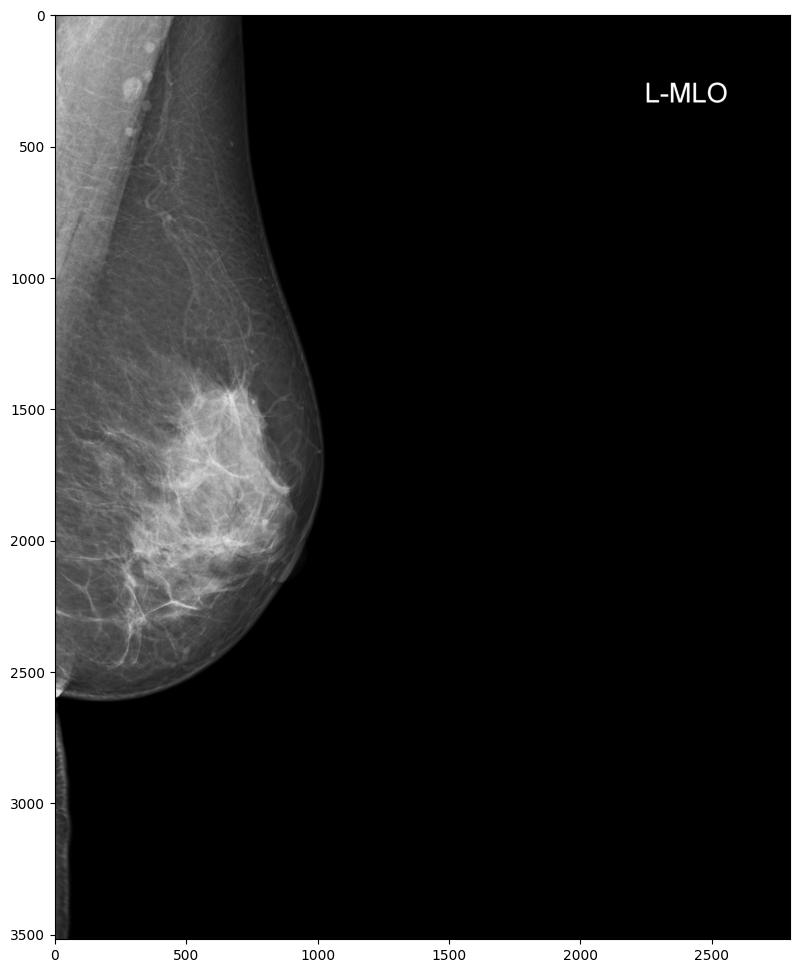

In [164]:
import os
import random
import pydicom
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from pydicom.pixel_data_handlers.util import apply_voi_lut
import pandas as pd

# Ruta al CSV de anotaciones de findings y la carpeta de imágenes DICOM
finding_csv_path = '/Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/original/Vindrmammo/finding_annotations.csv'
dicom_root = '/Volumes/m2/Memoria/Code/PMM/VinDr-Mammo-Preprocessing/data/original/Vindrmammo/images'

# Cargar el CSV de anotaciones (finding_annotations.csv)
finding_df = pd.read_csv(finding_csv_path)

# Función para obtener una ruta DICOM al azar
def get_random_dicom_path(dicom_root):
    # Obtener una lista de todas las subcarpetas (study_id) en el directorio raíz
    study_ids = [d for d in os.listdir(dicom_root) if os.path.isdir(os.path.join(dicom_root, d))]
    
    if not study_ids:
        raise FileNotFoundError("No se encontraron carpetas en la ruta del dicom_root.")

    # Elegir una carpeta (study_id) al azar
    random_study = random.choice(study_ids)
    study_path = os.path.join(dicom_root, random_study)

    # Obtener una lista de todos los archivos DICOM en la carpeta elegida
    dicom_files = [f for f in os.listdir(study_path) if f.endswith('.dicom')]

    if not dicom_files:
        raise FileNotFoundError(f"No se encontraron archivos DICOM en la carpeta {study_path}.")

    # Elegir un archivo DICOM al azar
    random_dicom_file = random.choice(dicom_files)
    return os.path.join(study_path, random_dicom_file)

# Función para mostrar una imagen DICOM y añadir una bounding box
def show_dicom_image_with_bbox(dicom_path, findings, title):
    dicom = pydicom.dcmread(dicom_path)
    
    # Aplicar VOI LUT si está disponible
    if 'WindowCenter' in dicom and 'WindowWidth' in dicom:
        image = apply_voi_lut(dicom.pixel_array, dicom)
    else:
        image = dicom.pixel_array
    
    # Crear la figura y los ejes para la visualización en grande
    fig, ax = plt.subplots(figsize=(12, 12))  # Imagen grande

    # Mostrar la imagen en escala de grises
    ax.imshow(image, cmap='gray')

    # Añadir bounding box para todos los findings de la imagen
    for _, row in findings.iterrows():
        x1, y1 = int(row['xmin']), int(row['ymin'])
        x2, y2 = int(row['xmax']), int(row['ymax'])

        # Asegurarse de que las coordenadas estén dentro del rango de la imagen
        x1 = max(0, x1)
        y1 = max(0, y1)
        x2 = min(image.shape[1], x2)
        y2 = min(image.shape[0], y2)

        # Calcular el ancho y alto del rectángulo (ROI)
        width, height = x2 - x1, y2 - y1

        # Crear un rectángulo con las coordenadas de la ROI
        rect = patches.Rectangle((x1, y1), width, height, linewidth=2, edgecolor='red', facecolor='none')
        ax.add_patch(rect)

    # Etiquetar los ejes
    ax.set_xlabel('Píxeles (X)', fontsize=10)
    ax.set_ylabel('Píxeles (Y)', fontsize=10)

    # Añadir un título a la imagen
    ax.set_title(title, fontsize=15)

    # Mostrar la imagen con bounding box
    plt.show()

# Obtener una ruta de un archivo DICOM al azar
random_dicom_path = get_random_dicom_path(dicom_root)

# Seleccionar una fila al azar del dataframe de findings que corresponde a la imagen seleccionada
image_id = os.path.basename(random_dicom_path).split('.')[0]
findings = finding_df[finding_df['image_id'] == image_id]

# Mostrar la imagen DICOM con el bounding box
print(f"Mostrando imagen DICOM al azar: {random_dicom_path}")
show_dicom_image_with_bbox(random_dicom_path, findings, 'Imagen DICOM al azar con Bounding Box')
